In [18]:
import os
import matplotlib.image as mpimg


label_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/stratified_split/labels"

file_label_counts = []

for file in os.listdir(label_dir):
    if file.endswith(".txt"):
        file_path = os.path.join(label_dir, file)
        with open(file_path, 'r') as f:
            num_labels = sum(1 for line in f if line.strip())
            file_label_counts.append((file, num_labels))

# Sort files by number of labels in descending order
file_label_counts.sort(key=lambda x: x[1], reverse=True)

# Print top 10
for i, (filename, count) in enumerate(file_label_counts[:10], 1):
    print(f"{i}. {filename}: {count} labels")


1. 27.7644_77.7249.txt: 22 labels
2. 27.7644_77.7283.txt: 20 labels
3. 24.0172_89.0908.txt: 17 labels
4. 25.6628_84.9646.txt: 16 labels
5. 25.6628_84.9613.txt: 14 labels
6. 25.1556_82.9985.txt: 13 labels
7. 25.6540_84.9437.txt: 13 labels
8. 22.6415_88.9254.txt: 13 labels
9. 24.0997_90.3408.txt: 12 labels
10. 23.7997_90.3144.txt: 12 labels


In [95]:
import os
import shutil

# Paths
label_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/stratified_split/labels"
image_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/stratified_split/images"
output_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/most_labels"

# Create output directory if needed
os.makedirs(output_dir, exist_ok=True)

# Collect and count labels
file_label_counts = []
for file in os.listdir(label_dir):
    if file.endswith(".txt"):
        file_path = os.path.join(label_dir, file)
        with open(file_path, 'r') as f:
            num_labels = sum(1 for line in f if line.strip())
            file_label_counts.append((file, num_labels))

# Sort and get top 10
file_label_counts.sort(key=lambda x: x[1], reverse=True)
top_10 = file_label_counts[:60]

# Fetch and copy corresponding images and label files
copied_files = []
for label_file, count in top_10:
    base_name = os.path.splitext(label_file)[0]
    label_src = os.path.join(label_dir, label_file)
    label_dst = os.path.join(output_dir, label_file)

    # Copy label file
    shutil.copy(label_src, label_dst)

    # Try different image extensions
    for ext in ['.png', '.jpg', '.jpeg', '.tif']:
        image_path = os.path.join(image_dir, base_name + ext)
        if os.path.exists(image_path):
            shutil.copy(image_path, os.path.join(output_dir, base_name + ext))
            copied_files.append((label_file, os.path.basename(image_path)))
            break

# Print summary
print("Top 10 label files and corresponding images copied:")
for i, (label_file, image_name) in enumerate(copied_files, 1):
    print(f"{i}. {label_file} → {image_name}")


Top 10 label files and corresponding images copied:
1. 27.7644_77.7249.txt → 27.7644_77.7249.png
2. 27.7644_77.7283.txt → 27.7644_77.7283.png
3. 24.0172_89.0908.txt → 24.0172_89.0908.png
4. 25.6628_84.9646.txt → 25.6628_84.9646.png
5. 25.6628_84.9613.txt → 25.6628_84.9613.png
6. 25.1556_82.9985.txt → 25.1556_82.9985.png
7. 25.6540_84.9437.txt → 25.6540_84.9437.png
8. 22.6415_88.9254.txt → 22.6415_88.9254.png
9. 24.0997_90.3408.txt → 24.0997_90.3408.png
10. 23.7997_90.3144.txt → 23.7997_90.3144.png
11. 23.7415_86.9931.txt → 23.7415_86.9931.png
12. 23.6261_89.8530.txt → 23.6261_89.8530.png
13. 33.5838_72.9061.txt → 33.5838_72.9061.png
14. 22.6118_88.5843.txt → 22.6118_88.5843.png
15. 22.6151_88.5843.txt → 22.6151_88.5843.png
16. 33.9011_71.6312.txt → 33.9011_71.6312.png
17. 23.6261_90.4408.txt → 23.6261_90.4408.png
18. 24.7715_84.3146.txt → 24.7715_84.3146.png
19. 33.8978_71.6312.txt → 33.8978_71.6312.png
20. 25.8467_80.6397.txt → 25.8467_80.6397.png
21. 22.5761_92.0529.txt → 22.5761_92.

In [96]:
from shapely.geometry import Point, Polygon


In [97]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Polygon, Rectangle

def display_image(file_name, directory_path, directory_path_labels=None, save_path=None, sentinel=True, obb=False):
    img_path = os.path.join(directory_path, file_name)
    print(img_path)
    img = mpimg.imread(img_path)
    fig, ax = plt.subplots(figsize=(6, 6))

    # Class color map
    color_map = {
        0: {'edge': '#8B0000', 'fill': '#FFC0CB'},  # Deep Red + Light Red
        1: {'edge': '#00008B', 'fill': '#ADD8E6'},  # Deep Blue + Light Blue
        2: {'edge': '#006400', 'fill': '#90EE90'},  # Deep Green + Light Green
    }

    if directory_path_labels:
        label_path = os.path.join(directory_path_labels, file_name[:-4] + '.txt')
        print(label_path)
        if os.path.exists(label_path):
            with open(label_path, 'r') as file:
                lines = file.readlines()

            for line in lines:
                cor = np.fromstring(line.strip(), sep=' ')
                class_id = int(cor[0])
                colors = color_map.get(class_id, {'edge': 'white', 'fill': 'gray'})

                if not obb:
                    rect_x = cor[1] * img.shape[1]
                    rect_y = cor[2] * img.shape[0]
                    width = cor[3] * img.shape[1]
                    height = cor[4] * img.shape[0]

                    top_left_x = rect_x - width / 2
                    top_left_y = rect_y - height / 2
                    rect = Rectangle(
                        (top_left_x, top_left_y), width, height,
                        linewidth=1, edgecolor=colors['edge'], facecolor=colors['fill'], alpha=0.5
                    )
                    ax.add_patch(rect)
                else:
                    # Extract and scale polygon corners
                    rect_x = cor[1] * img.shape[1]
                    rect_y = cor[2] * img.shape[0]
                    corners = cor[1:].reshape(4, 2)

                    corners[:, 0] *= img.shape[1]
                    corners[:, 1] *= img.shape[0]

                    polygon = Polygon(
                        corners,
                        linewidth=1.5,
                        edgecolor=colors['edge'],
                        facecolor='none',  # Changed 'none' to 'none' (string)
                        alpha=1
                    )
                    ax.add_patch(polygon)
                    center_x = np.mean(corners[:, 0])
                    center_y = np.mean(corners[:, 1])
                    ax.scatter([center_x], [center_y], color=colors['edge'], s=10, zorder=10)

    ax.axis('off')
    ax.imshow(img)
    # format_axes(ax)

    if save_path:
        if sentinel==False:
            if directory_path_labels:
                if obb:
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_obb.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', pad_inches=0,dpi=600) 
                else:   
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_box.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight',pad_inches=0, dpi=600)
            else:
                combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}.pdf')
                plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight',pad_inches=0, dpi=600,)
        else:
            if directory_path_labels:  
                if obb:
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_sen_obb.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight',pad_inches=0, dpi=600)  
                else:
                    combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_sen_box.pdf')
                    plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight',pad_inches=0, dpi=600)
            else:
                combined_plot_path = os.path.join(save_path, f'{file_name[:-4]}_sen.pdf')
                plt.savefig(combined_plot_path, format='pdf', bbox_inches='tight', pad_inches=0, dpi=600)

    plt.show()
    plt.close(fig)


In [ ]:
# ======= RUN ON ALL IMAGES IN THE DIRECTORY =======

most_labels_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/most_labels"
image_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/stratified_split/images"
label_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/stratified_split/labels"
save_dir = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/brick_kilns_neurips_2025/figures"

# Process all image files
for file_name in os.listdir(most_labels_dir):
    if file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.tif')):
        print(f"Processing: {file_name}")
        display_image(
            file_name=file_name,
            directory_path=image_dir,
            directory_path_labels=label_dir,
            save_path=save_dir,
            sentinel=False,
            obb=True
        )

In [1]:
def get_image_polygon(center_lat, center_lon, img_size=128, resolution=10):
    """
    Generate polygon coordinates for a square satellite image.

    Args:
        center_lat (float): Latitude of the image center.
        center_lon (float): Longitude of the image center.
        img_size (int): Image size in pixels (assumed square).
        resolution (float): Spatial resolution in meters per pixel.

    Returns:
        list: Polygon coordinates in [lon, lat] format (GeoJSON style).
    """
    # Convert image size to meters
    img_meters = img_size * resolution  # e.g., 128 * 10 = 1280 meters

    # Convert meters to degrees (approximate, assuming near equator)
    meters_per_degree = 111320  # average meters per degree
    deg_offset = (img_meters / 2) / meters_per_degree  # half-size in degrees

    # Calculate corners
    top_left     = [center_lon - deg_offset, center_lat + deg_offset]
    top_right    = [center_lon + deg_offset, center_lat + deg_offset]
    bottom_right = [center_lon + deg_offset, center_lat - deg_offset]
    bottom_left  = [center_lon - deg_offset, center_lat - deg_offset]

    # Close the polygon loop
    polygon = [top_left, top_right, bottom_right, bottom_left, top_left]
    return polygon

# Example usage
center_lat = 25.6540
center_lon = 84.9437
polygon_coords = get_image_polygon(center_lat, center_lon, img_size=128, resolution=10)

# Print in GeoJSON format
import json
geojson_polygon = {
    "type": "Polygon",
    "coordinates": [polygon_coords]
}

print(json.dumps(geojson_polygon, indent=2))


{
  "type": "Polygon",
  "coordinates": [
    [
      [
        84.93795080848007,
        25.659749191519943
      ],
      [
        84.94944919151995,
        25.659749191519943
      ],
      [
        84.94944919151995,
        25.648250808480057
      ],
      [
        84.93795080848007,
        25.648250808480057
      ],
      [
        84.93795080848007,
        25.659749191519943
      ]
    ]
  ]
}


In [2]:
import json

def get_image_polygon(center_lat, center_lon, img_size=128, resolution=10):
    """
    Generate polygon coordinates for a square satellite image.

    Args:
        center_lat (float): Latitude of the image center.
        center_lon (float): Longitude of the image center.
        img_size (int): Image size in pixels (assumed square).
        resolution (float): Spatial resolution in meters per pixel.

    Returns:
        list: Polygon coordinates in [lon, lat] format.
    """
    meters_per_degree = 111320  # Approx. meters per degree of latitude
    offset_deg = (img_size * resolution / 2) / meters_per_degree

    top_left     = [center_lon - offset_deg, center_lat + offset_deg]
    top_right    = [center_lon + offset_deg, center_lat + offset_deg]
    bottom_right = [center_lon + offset_deg, center_lat - offset_deg]
    bottom_left  = [center_lon - offset_deg, center_lat - offset_deg]

    polygon = [top_left, top_right, bottom_right, bottom_left, top_left]
    return polygon

# Input
center_lat = 25.6540
center_lon = 84.9437
polygon_coords = get_image_polygon(center_lat, center_lon)

# GeoJSON structure
geojson_data = {
    "type": "FeatureCollection",
    "features": [
        {
            "type": "Feature",
            "properties": {
                "name": "Sentinel_Image_Footprint"
            },
            "geometry": {
                "type": "Polygon",
                "coordinates": [polygon_coords]
            }
        }
    ]
}

# Save to file
output_file = "sentinel_image_polygon.geojson"
with open(output_file, "w") as f:
    json.dump(geojson_data, f, indent=2)

print(f"GeoJSON saved to {output_file}")


GeoJSON saved to sentinel_image_polygon.geojson


In [3]:
from pyproj import Transformer

def convert_tile_name_to_latlon(filename):
    # Extract coordinates from filename
    x_str, y_str = filename.replace(".txt", "").split("_")
    x_m, y_m = int(x_str), int(y_str)

    # Create a transformer from EPSG:3857 to EPSG:4326 (lat/lon)
    transformer = Transformer.from_crs("EPSG:3857", "EPSG:4326", always_xy=True)
    lon, lat = transformer.transform(x_m, y_m)

    return lat, lon

# Example usage
filename = "9290464_2879839.txt"
lat, lon = convert_tile_name_to_latlon(filename)
print(f"Filename {filename} corresponds to coordinates: lat={lat:.6f}, lon={lon:.6f}")


Filename 9290464_2879839.txt corresponds to coordinates: lat=25.033330, lon=83.457658


In [4]:
from pathlib import Path

# Directory containing label files
label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/labels")

# Count the number of lines (labels) in each file
label_counts = [(file.name, file.read_text().count('\n') + (1 if file.read_text() else 0)) 
                for file in label_dir.glob("*.txt")]

# Sort by count in descending order and get top 3
top_3_files = sorted(label_counts, key=lambda x: x[1], reverse=True)[:3]
top_3_files


[('9021406_3115876.txt', 13),
 ('8988385_3137890.txt', 13),
 ('9040668_3088359.txt', 13)]

In [6]:
from pathlib import Path

# Directories
label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/labels")
image_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images")

# Count labels
label_counts = [
    (file.stem, file.read_text().count('\n') + (1 if file.read_text() else 0))
    for file in label_dir.glob("*.txt")
]

# Top 3 label files
top_3 = sorted(label_counts, key=lambda x: x[1], reverse=True)[:3]

# Find corresponding image files
corresponding_images = []
for stem, count in top_3:
    for ext in ['.png', '.jpg', '.jpeg','.tif']:
        image_file = image_dir / f"{stem}{ext}"
        if image_file.exists():
            corresponding_images.append(image_file)
            break  # Stop at the first found match

top_3, corresponding_images


([('9021406_3115876', 13), ('8988385_3137890', 13), ('9040668_3088359', 13)],
 [PosixPath('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images/9021406_3115876.tif'),
  PosixPath('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images/8988385_3137890.tif'),
  PosixPath('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images/9040668_3088359.tif')])

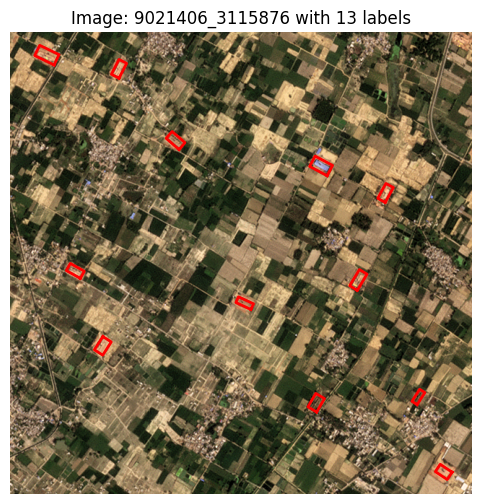

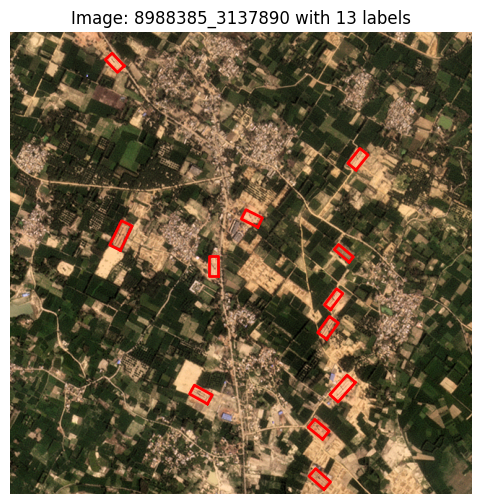

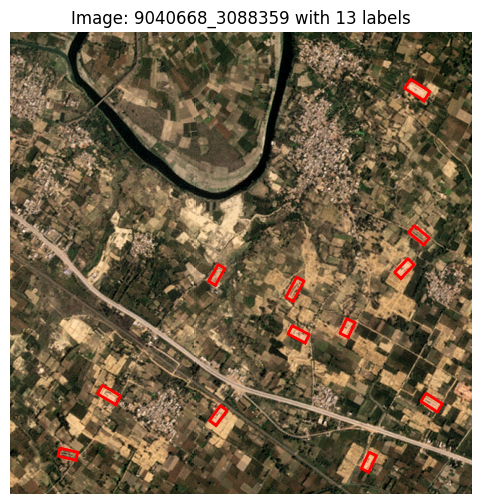

In [10]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import numpy as np

# Paths to label files and images
label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/labels")
image_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images")

# Top 3 files info (from your result)
top_files = [
    ('9021406_3115876', 13),
    ('8988385_3137890', 13),
    ('9040668_3088359', 13)
]

image_size = 640  # Image size (square 640x640)

for filename, count in top_files:
    label_path = label_dir / f"{filename}.txt"
    image_path = image_dir / f"{filename}.tif"

    # Load image
    image = Image.open(image_path)
    image_np = np.array(image)

    # Read all label lines
    with open(label_path, 'r') as f:
        lines = f.readlines()

    plt.figure(figsize=(6,6))
    plt.imshow(image_np)
    
    for line in lines:
        parts = line.strip().split()
        cls_id = parts[0]
        coords = list(map(float, parts[1:] ))
        points = np.array(coords).reshape(-1, 2) * image_size  # scale normalized to pixels
        
        # Close polygon by appending first point at end
        polygon = np.vstack([points, points[0]])

        # Plot polygon
        plt.plot(polygon[:, 0], polygon[:, 1], 'r-', linewidth=2)
        # plt.scatter(points[:, 0], points[:, 1], c='blue', s=15)
    
    plt.title(f"Image: {filename} with {count} labels")
    plt.axis('off')
    plt.show()


In [11]:
import rasterio
from pathlib import Path

# Paths
tiff_files = [
    Path('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images/9021406_3115876.tif'),
    Path('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images/8988385_3137890.tif'),
    Path('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images/9040668_3088359.tif')
]

png_dir = Path('/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb')

# Get bounding boxes of TIFF files (in lon/lat)
tiff_bounds = []
for tiff in tiff_files:
    with rasterio.open(tiff) as src:
        bounds = src.bounds  # bounds in src CRS
        crs = src.crs

        # Convert bounds to lat/lon if needed
        if crs.is_geographic:
            # already lon/lat
            tiff_bounds.append(bounds)
        else:
            # transform corners to lat/lon
            from rasterio.warp import transform_bounds
            bounds_latlon = transform_bounds(crs, 'EPSG:4326', *bounds)
            tiff_bounds.append(bounds_latlon)

# Check each PNG if it lies inside any of the tiff bounding boxes
def point_in_bounds(lat, lon, bounds):
    minx, miny, maxx, maxy = bounds
    return (minx <= lon <= maxx) and (miny <= lat <= maxy)

matching_files = []

for png_file in png_dir.glob("*.png"):
    # Filename format is "lat_lon.png"
    name = png_file.stem
    try:
        lat_str, lon_str = name.split('_')
        lat = float(lat_str)
        lon = float(lon_str)
    except Exception as e:
        continue  # skip files not matching format

    # Check if point in any tiff bounding box
    for idx, bounds in enumerate(tiff_bounds):
        if point_in_bounds(lat, lon, bounds):
            matching_files.append((png_file.name, tiff_files[idx].name))
            break

print("PNG files inside the 3 TIFF geometries:")
for png_name, tiff_name in matching_files:
    print(f"{png_name} inside {tiff_name}")


PNG files inside the 3 TIFF geometries:
27.1178_80.7410.png inside 8988385_3137890.tif
26.7266_81.2146.png inside 9040668_3088359.tif
27.1056_80.7443.png inside 8988385_3137890.tif
27.1267_80.7322.png inside 8988385_3137890.tif
26.7090_81.2234.png inside 9040668_3088359.tif
27.1090_80.7443.png inside 8988385_3137890.tif
27.1056_80.7410.png inside 8988385_3137890.tif
27.1090_80.7410.png inside 8988385_3137890.tif
27.1267_80.7443.png inside 8988385_3137890.tif
26.7266_81.2234.png inside 9040668_3088359.tif
26.9355_81.0409.png inside 9021406_3115876.tif
26.7090_81.2146.png inside 9040668_3088359.tif
27.1267_80.7557.png inside 8988385_3137890.tif
26.7266_81.2058.png inside 9040668_3088359.tif
27.1178_80.7443.png inside 8988385_3137890.tif
26.7178_81.2058.png inside 9040668_3088359.tif
26.7178_81.2146.png inside 9040668_3088359.tif
27.1056_80.7557.png inside 8988385_3137890.tif
27.1056_80.7322.png inside 8988385_3137890.tif
26.9443_81.0409.png inside 9021406_3115876.tif
27.1090_80.7557.png 

In [13]:
from pathlib import Path

# List of matched PNG files you provided
matched_png_names = [
    "27.1178_80.7410.png",
    "26.7266_81.2146.png",
    "27.1056_80.7443.png",
    "27.1267_80.7322.png",
    "26.7090_81.2234.png",
    "27.1090_80.7443.png",
    "27.1056_80.7410.png",
    "27.1090_80.7410.png",
    "27.1267_80.7443.png",
    "26.7266_81.2234.png",
    "26.9355_81.0409.png",
    "26.7090_81.2146.png",
    "27.1267_80.7557.png",
    "26.7266_81.2058.png",
    "27.1178_80.7443.png",
    "26.7178_81.2058.png",
    "26.7178_81.2146.png",
    "27.1056_80.7557.png",
    "27.1056_80.7322.png",
    "26.9443_81.0409.png",
    "27.1090_80.7557.png",
    "27.1178_80.7557.png",
    "26.9355_81.0321.png",
    "26.9443_81.0321.png",
    "26.7178_81.2234.png",
    "27.1178_80.7322.png",
    "26.9355_81.0443.png",
    "27.1090_80.7322.png",
    "27.1267_80.7410.png",
    "26.7090_81.2058.png",
    "26.9443_81.0443.png"
]

matched_basenames = {Path(name).stem for name in matched_png_names}

label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels")

# Find label files matching matched basenames
matched_label_files = [f for f in label_dir.glob("*.txt") if f.stem in matched_basenames]

# Count labels (lines) in each matched label file
label_counts = []
for label_file in matched_label_files:
    with open(label_file, 'r') as f:
        lines = f.readlines()
        count = len(lines)
        label_counts.append((label_file.name, count))

# Find file(s) with the max label count
max_count = max(label_counts, key=lambda x: x[1])[1]
files_with_max_labels = [f for f in label_counts if f[1] == max_count]

print(f"Max label count is {max_count}")
print("File(s) with the most labels:")
for fname, count in files_with_max_labels:
    print(f"{fname} : {count} labels")


Max label count is 6
File(s) with the most labels:
27.1267_80.7322.txt : 6 labels


In [14]:
from pathlib import Path

# Your PNG to TIFF mapping as given earlier:
png_to_tif_map = {
    "27.1178_80.7410": "8988385_3137890.tif",
    "26.7266_81.2146": "9040668_3088359.tif",
    "27.1056_80.7443": "8988385_3137890.tif",
    "27.1267_80.7322": "8988385_3137890.tif",
    "26.7090_81.2234": "9040668_3088359.tif",
    "27.1090_80.7443": "8988385_3137890.tif",
    "27.1056_80.7410": "8988385_3137890.tif",
    "27.1090_80.7410": "8988385_3137890.tif",
    "27.1267_80.7443": "8988385_3137890.tif",
    "26.7266_81.2234": "9040668_3088359.tif",
    "26.9355_81.0409": "9021406_3115876.tif",
    "26.7090_81.2146": "9040668_3088359.tif",
    "27.1267_80.7557": "8988385_3137890.tif",
    "26.7266_81.2058": "9040668_3088359.tif",
    "27.1178_80.7443": "8988385_3137890.tif",
    "26.7178_81.2058": "9040668_3088359.tif",
    "26.7178_81.2146": "9040668_3088359.tif",
    "27.1056_80.7557": "8988385_3137890.tif",
    "27.1056_80.7322": "8988385_3137890.tif",
    "26.9443_81.0409": "9021406_3115876.tif",
    "27.1090_80.7557": "8988385_3137890.tif",
    "27.1178_80.7557": "8988385_3137890.tif",
    "26.9355_81.0321": "9021406_3115876.tif",
    "26.9443_81.0321": "9021406_3115876.tif",
    "26.7178_81.2234": "9040668_3088359.tif",
    "27.1178_80.7322": "8988385_3137890.tif",
    "26.9355_81.0443": "9021406_3115876.tif",
    "27.1090_80.7322": "8988385_3137890.tif",
    "27.1267_80.7410": "8988385_3137890.tif",
    "26.7090_81.2058": "9040668_3088359.tif",
    "26.9443_81.0443": "9021406_3115876.tif"
}

label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels")

# Get list of all label files corresponding to matched PNGs (by basename)
matched_basenames = set(png_to_tif_map.keys())
matched_label_files = [f for f in label_dir.glob("*.txt") if f.stem in matched_basenames]

# Count labels in each file
label_counts = []
for label_file in matched_label_files:
    with open(label_file, 'r') as f:
        lines = f.readlines()
        count = len(lines)
        label_counts.append((label_file.stem, label_file.name, count))

# Find max label count
max_count = max(label_counts, key=lambda x: x[2])[2]

# Filter files with max count
files_with_max_labels = [f for f in label_counts if f[2] == max_count]

print(f"Max label count: {max_count}")
print("Files with the most labels and their corresponding TIFF images:")

for stem, fname, count in files_with_max_labels:
    tif_file = png_to_tif_map.get(stem, "Unknown TIFF")
    print(f"{fname} ({count} labels) belongs to {tif_file}")


Max label count: 6
Files with the most labels and their corresponding TIFF images:
27.1267_80.7322.txt (6 labels) belongs to 8988385_3137890.tif


Max label count: 6
Files with the most labels:
27.1267_80.7322.txt (6 labels)


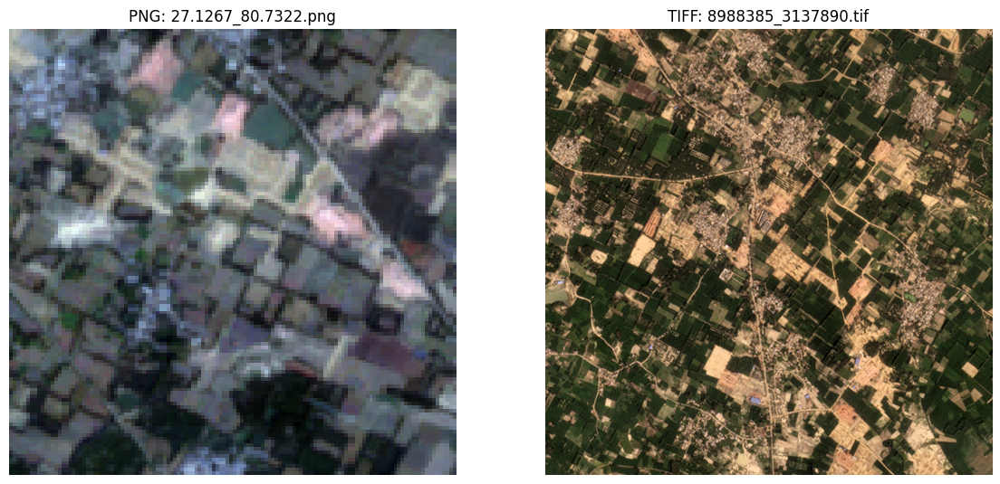

In [15]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
import rasterio

# Paths
label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels")
png_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb")
tif_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images")

# PNG to TIFF mapping (as provided before)
png_to_tif_map = {
    "27.1178_80.7410": "8988385_3137890.tif",
    "26.7266_81.2146": "9040668_3088359.tif",
    "27.1056_80.7443": "8988385_3137890.tif",
    "27.1267_80.7322": "8988385_3137890.tif",
    "26.7090_81.2234": "9040668_3088359.tif",
    "27.1090_80.7443": "8988385_3137890.tif",
    "27.1056_80.7410": "8988385_3137890.tif",
    "27.1090_80.7410": "8988385_3137890.tif",
    "27.1267_80.7443": "8988385_3137890.tif",
    "26.7266_81.2234": "9040668_3088359.tif",
    "26.9355_81.0409": "9021406_3115876.tif",
    "26.7090_81.2146": "9040668_3088359.tif",
    "27.1267_80.7557": "8988385_3137890.tif",
    "26.7266_81.2058": "9040668_3088359.tif",
    "27.1178_80.7443": "8988385_3137890.tif",
    "26.7178_81.2058": "9040668_3088359.tif",
    "26.7178_81.2146": "9040668_3088359.tif",
    "27.1056_80.7557": "8988385_3137890.tif",
    "27.1056_80.7322": "8988385_3137890.tif",
    "26.9443_81.0409": "9021406_3115876.tif",
    "27.1090_80.7557": "8988385_3137890.tif",
    "27.1178_80.7557": "8988385_3137890.tif",
    "26.9355_81.0321": "9021406_3115876.tif",
    "26.9443_81.0321": "9021406_3115876.tif",
    "26.7178_81.2234": "9040668_3088359.tif",
    "27.1178_80.7322": "8988385_3137890.tif",
    "26.9355_81.0443": "9021406_3115876.tif",
    "27.1090_80.7322": "8988385_3137890.tif",
    "27.1267_80.7410": "8988385_3137890.tif",
    "26.7090_81.2058": "9040668_3088359.tif",
    "26.9443_81.0443": "9021406_3115876.tif"
}

# Step 1: Find the label file(s) with max labels from matched ones
matched_basenames = set(png_to_tif_map.keys())
matched_label_files = [f for f in label_dir.glob("*.txt") if f.stem in matched_basenames]

label_counts = []
for label_file in matched_label_files:
    with open(label_file, 'r') as f:
        lines = f.readlines()
        count = len(lines)
        label_counts.append((label_file.stem, label_file.name, count))

max_count = max(label_counts, key=lambda x: x[2])[2]
files_with_max_labels = [f for f in label_counts if f[2] == max_count]

print(f"Max label count: {max_count}")
print("Files with the most labels:")

for stem, fname, count in files_with_max_labels:
    print(f"{fname} ({count} labels)")

    # Load PNG image
    png_path = png_dir / f"{stem}.png"
    if not png_path.exists():
        print(f"PNG file not found: {png_path}")
        continue
    png_img = Image.open(png_path)

    # Load TIFF image
    tif_name = png_to_tif_map.get(stem)
    tif_path = tif_dir / tif_name
    if not tif_path.exists():
        print(f"TIFF file not found: {tif_path}")
        continue
    with rasterio.open(tif_path) as src:
        tif_img = src.read([1, 2, 3])  # read RGB bands assuming RGB in first 3 bands
        tif_img = tif_img.transpose((1, 2, 0))  # rearrange to HWC for matplotlib

    # Plot side by side
    fig, axs = plt.subplots(1, 2, figsize=(14, 7))
    axs[0].imshow(png_img)
    axs[0].set_title(f"PNG: {stem}.png")
    axs[0].axis("off")

    axs[1].imshow(tif_img)
    axs[1].set_title(f"TIFF: {tif_name}")
    axs[1].axis("off")

    plt.show()


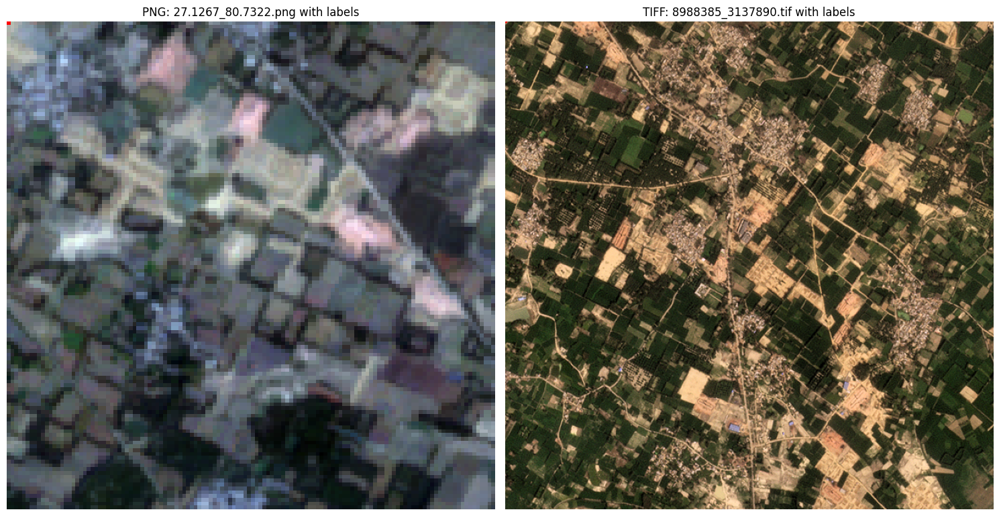

In [17]:
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image, ImageDraw
import rasterio
import numpy as np

def read_obb_labels(label_file):
    """
    Read oriented bounding box labels from a label file.
    Format assumed per line: class_id x1 y1 x2 y2 x3 y3 x4 y4
    Returns list of tuples: (class_id, [(x1,y1), (x2,y2), (x3,y3), (x4,y4)])
    """
    labels = []
    with open(label_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:9]))
            polygon = [(coords[i], coords[i+1]) for i in range(0, 8, 2)]
            labels.append((class_id, polygon))
    return labels

def draw_polygons_on_pil_image(image, labels, color='red', width=2):
    """
    Draw polygons on a PIL image.
    """
    draw = ImageDraw.Draw(image)
    for _, polygon in labels:
        draw.line(polygon + [polygon[0]], fill=color, width=width)
    return image

def draw_polygons_on_numpy_image(image, labels, color=(255,0,0), width=2):
    """
    Draw polygons on a numpy image (H,W,3) using matplotlib patches.
    We will draw polygons in matplotlib plot instead of modifying numpy array directly.
    """
    import matplotlib.patches as patches
    fig, ax = plt.subplots()
    ax.imshow(image)
    for _, polygon in labels:
        poly = patches.Polygon(polygon, closed=True, fill=False, edgecolor=np.array(color)/255, linewidth=width)
        ax.add_patch(poly)
    ax.axis('off')
    return fig, ax

# Paths
label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels")
png_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb")
tif_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images")

png_to_tif_map = {
    "27.1178_80.7410": "8988385_3137890.tif",
    "26.7266_81.2146": "9040668_3088359.tif",
    "27.1056_80.7443": "8988385_3137890.tif",
    "27.1267_80.7322": "8988385_3137890.tif",
    "26.7090_81.2234": "9040668_3088359.tif",
    "27.1090_80.7443": "8988385_3137890.tif",
    "27.1056_80.7410": "8988385_3137890.tif",
    "27.1090_80.7410": "8988385_3137890.tif",
    "27.1267_80.7443": "8988385_3137890.tif",
    "26.7266_81.2234": "9040668_3088359.tif",
    "26.9355_81.0409": "9021406_3115876.tif",
    "26.7090_81.2146": "9040668_3088359.tif",
    "27.1267_80.7557": "8988385_3137890.tif",
    "26.7266_81.2058": "9040668_3088359.tif",
    "27.1178_80.7443": "8988385_3137890.tif",
    "26.7178_81.2058": "9040668_3088359.tif",
    "26.7178_81.2146": "9040668_3088359.tif",
    "27.1056_80.7557": "8988385_3137890.tif",
    "27.1056_80.7322": "8988385_3137890.tif",
    "26.9443_81.0409": "9021406_3115876.tif",
    "27.1090_80.7557": "8988385_3137890.tif",
    "27.1178_80.7557": "8988385_3137890.tif",
    "26.9355_81.0321": "9021406_3115876.tif",
    "26.9443_81.0321": "9021406_3115876.tif",
    "26.7178_81.2234": "9040668_3088359.tif",
    "27.1178_80.7322": "8988385_3137890.tif",
    "26.9355_81.0443": "9021406_3115876.tif",
    "27.1090_80.7322": "8988385_3137890.tif",
    "27.1267_80.7410": "8988385_3137890.tif",
    "26.7090_81.2058": "9040668_3088359.tif",
    "26.9443_81.0443": "9021406_3115876.tif"
}

# Example: Plot for the file with max labels (you can loop this or pass the name)
label_name = "27.1267_80.7322"  # Change to whichever label file you want

label_path = label_dir / f"{label_name}.txt"
png_path = png_dir / f"{label_name}.png"
tif_name = png_to_tif_map[label_name]
tif_path = tif_dir / tif_name

# Read labels
labels = read_obb_labels(label_path)

# Load PNG image and draw labels using PIL
png_img = Image.open(png_path).convert("RGB")
png_img_with_labels = draw_polygons_on_pil_image(png_img.copy(), labels, color='red', width=2)

# Load TIFF image with rasterio (RGB assumed bands 1,2,3)
with rasterio.open(tif_path) as src:
    tif_img = src.read([1, 2, 3])
    tif_img = np.transpose(tif_img, (1, 2, 0))  # HWC

# Plotting
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# PNG with polygons
axs[0].imshow(png_img_with_labels)
axs[0].set_title(f"PNG: {label_name}.png with labels")
axs[0].axis('off')

# TIFF with polygons using matplotlib patches
axs[1].imshow(tif_img)
for _, poly in labels:
    poly_patch = plt.Polygon(poly, fill=False, edgecolor='red', linewidth=2)
    axs[1].add_patch(poly_patch)
axs[1].set_title(f"TIFF: {tif_name} with labels")
axs[1].axis('off')

plt.tight_layout()
plt.show()


PNG image size: (128, 128)
Sample label polygon coordinates (first 3): [(1, [(0.080753, 0.288998), (0.142712, 0.220737), (0.1006, 0.190533), (0.038641, 0.258794)])]
X range: min 0.038641, max 0.142712
Y range: min 0.190533, max 0.288998


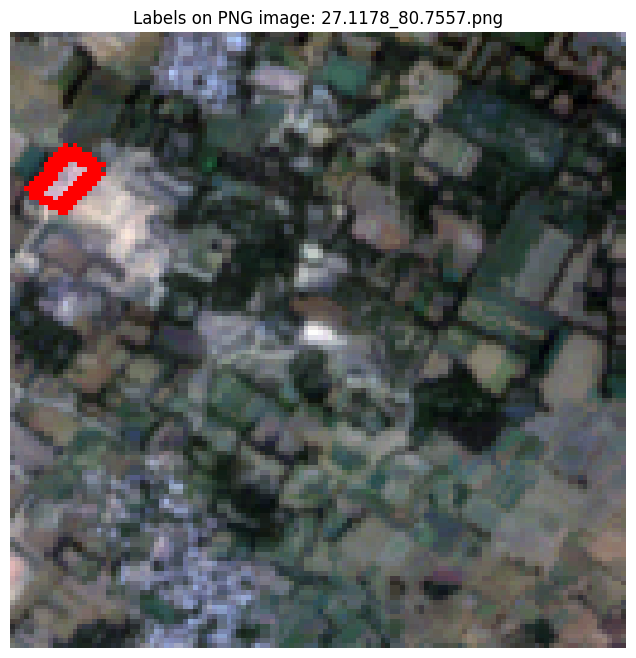

In [18]:
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def read_obb_labels(label_file):
    labels = []
    with open(label_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:9]))
            polygon = [(coords[i], coords[i+1]) for i in range(0, 8, 2)]
            labels.append((class_id, polygon))
    return labels

def draw_polygons(image, labels, color='red', width=2):
    draw = ImageDraw.Draw(image)
    for _, polygon in labels:
        draw.line(polygon + [polygon[0]], fill=color, width=width)
    return image

# Change this to your label name (without extension)
label_name = "27.1178_80.7557"

label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels")
png_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb")

label_path = label_dir / f"{label_name}.txt"
png_path = png_dir / f"{label_name}.png"

# Load PNG image
png_img = Image.open(png_path).convert("RGB")
print(f"PNG image size: {png_img.size}")  # (width, height)

# Read labels
labels = read_obb_labels(label_path)
print("Sample label polygon coordinates (first 3):", labels[:3])

# Are coordinates normalized (0-1) or absolute?
# Check max and min x,y values in polygon points:
all_x = [x for _, poly in labels for (x,y) in poly]
all_y = [y for _, poly in labels for (x,y) in poly]
print(f"X range: min {min(all_x)}, max {max(all_x)}")
print(f"Y range: min {min(all_y)}, max {max(all_y)}")

# If x,y are <1, they are normalized. Convert to absolute pixels:
if max(all_x) <= 1 and max(all_y) <= 1:
    labels_abs = []
    w, h = png_img.size
    for class_id, poly in labels:
        poly_abs = [(x*w, y*h) for (x,y) in poly]
        labels_abs.append((class_id, poly_abs))
else:
    labels_abs = labels

# Draw polygons on PNG
png_img_with_labels = draw_polygons(png_img.copy(), labels_abs, color='red', width=3)

plt.figure(figsize=(8,8))
plt.imshow(png_img_with_labels)
plt.title(f"Labels on PNG image: {label_name}.png")
plt.axis('off')
plt.show()


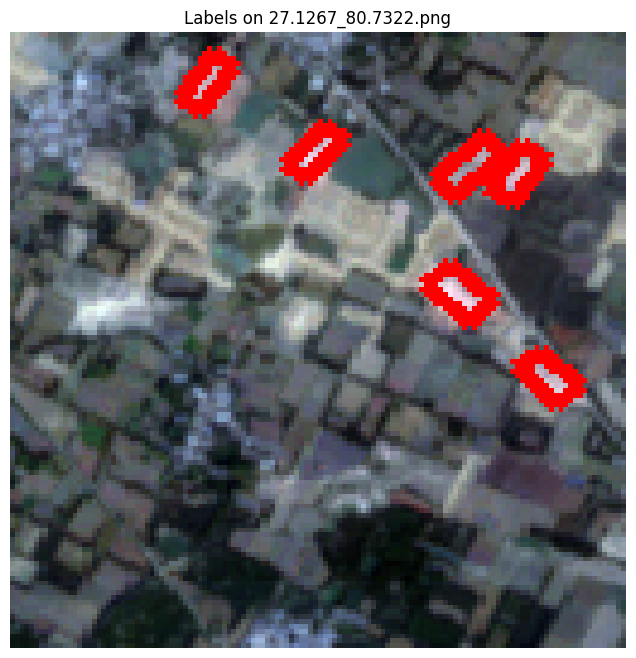

In [19]:
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def read_obb_labels(label_file):
    labels = []
    with open(label_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:9]))
            polygon = [(coords[i], coords[i+1]) for i in range(0, 8, 2)]
            labels.append((class_id, polygon))
    return labels

def draw_polygons(image, labels, color='red', width=2):
    draw = ImageDraw.Draw(image)
    for _, polygon in labels:
        draw.line(polygon + [polygon[0]], fill=color, width=width)
    return image

# Your label file and PNG image paths
label_name = "27.1267_80.7322"
label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels")
png_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb")

label_path = label_dir / f"{label_name}.txt"
png_path = png_dir / f"{label_name}.png"

# Load the PNG image
png_img = Image.open(png_path).convert("RGB")
width, height = png_img.size

# Read labels
labels = read_obb_labels(label_path)

# Check if coordinates are normalized (0-1 range)
all_x = [x for _, poly in labels for (x, y) in poly]
all_y = [y for _, poly in labels for (x, y) in poly]
if max(all_x) <= 1 and max(all_y) <= 1:
    # Convert normalized to absolute pixel coords
    labels_abs = []
    for class_id, poly in labels:
        poly_abs = [(x * width, y * height) for (x, y) in poly]
        labels_abs.append((class_id, poly_abs))
else:
    labels_abs = labels

# Draw polygons on the image
img_with_labels = draw_polygons(png_img.copy(), labels_abs, color='red', width=3)

# Show image with labels
plt.figure(figsize=(8, 8))
plt.imshow(img_with_labels)
plt.title(f"Labels on {label_name}.png")
plt.axis('off')
plt.show()


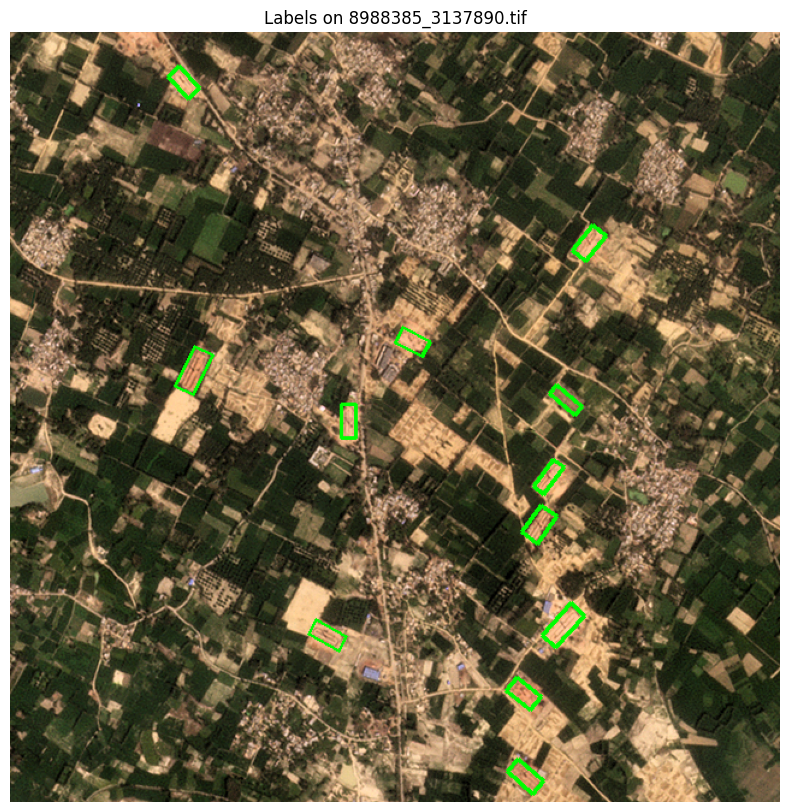

In [23]:
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def read_obb_labels(label_file):
    labels = []
    with open(label_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:9]))
            polygon = [(coords[i], coords[i+1]) for i in range(0, 8, 2)]
            labels.append((class_id, polygon))
    return labels

def draw_polygons(image, labels, color='red', width=2):
    draw = ImageDraw.Draw(image)
    for _, polygon in labels:
        draw.line(polygon + [polygon[0]], fill=color, width=width)
    return image

# Paths (adjust if needed)
tif_name = "8988385_3137890"
tif_path = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/images") / f"{tif_name}.tif"
label_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/labels")

# List of label files matched inside this TIFF (from your data)
matched_png_labels = [

    "8988385_3137890.txt"
]

# Load TIFF image
tif_img = Image.open(tif_path).convert("RGB")
width, height = tif_img.size

# Read and combine all labels from the matched PNG label files
all_labels = []
for label_file_name in matched_png_labels:
    label_path = label_dir / label_file_name
    labels = read_obb_labels(label_path)
    
    # Convert normalized coordinates to absolute pixel coords
    labels_abs = []
    for class_id, poly in labels:
        poly_abs = [(x * width, y * height) for (x, y) in poly]
        labels_abs.append((class_id, poly_abs))
    
    all_labels.extend(labels_abs)

# Draw all polygons on the TIFF image
img_with_labels = draw_polygons(tif_img.copy(), all_labels, color='lime', width=3)

# Plot the image with labels
plt.figure(figsize=(10, 10))
plt.imshow(img_with_labels)
plt.title(f"Labels on {tif_name}.tif")
plt.axis('off')
plt.show()


Skipping missing file: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb/27.1267_80.7557.png or /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels/27.1267_80.7557.txt
Skipping missing file: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb/27.1056_80.7322.png or /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels/27.1056_80.7322.txt
Skipping missing file: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb/27.1090_80.7557.png or /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/obb_labels/27.1090_80.7557.txt
Skipping missing file: /home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/lucknow_airshed/rgb/27.1090_8

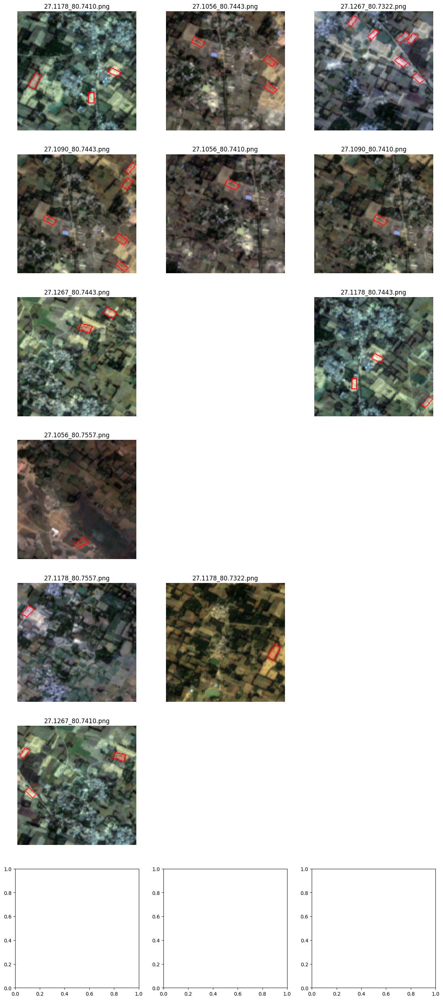

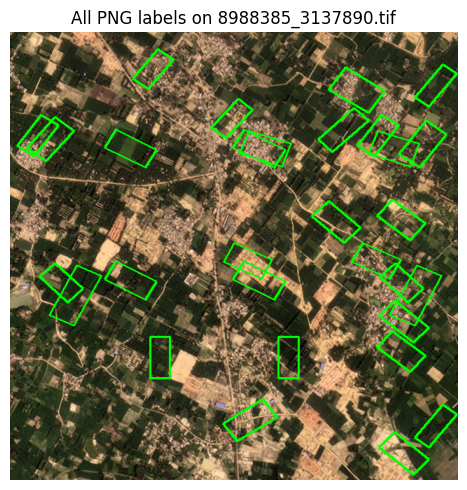

In [26]:
import math
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def read_obb_labels(label_file):
    labels = []
    with open(label_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:9]))
            polygon = [(coords[i], coords[i+1]) for i in range(0, 8, 2)]
            labels.append((class_id, polygon))
    return labels

def draw_polygons(image, labels, color='red', width=2):
    draw = ImageDraw.Draw(image)
    for _, polygon in labels:
        draw.line(polygon + [polygon[0]], fill=color, width=width)
    return image

# Paths
base_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data")
tif_name = "8988385_3137890"
tif_path = base_dir / "lucknow_airshed/images" / f"{tif_name}.tif"
png_dir = base_dir / "sentinel/lucknow_airshed/rgb"
label_dir = base_dir / "sentinel/lucknow_airshed/obb_labels"

png_to_tif_map = {
    "27.1178_80.7410": "8988385_3137890.tif",
    "26.7266_81.2146": "9040668_3088359.tif",
    "27.1056_80.7443": "8988385_3137890.tif",
    "27.1267_80.7322": "8988385_3137890.tif",
    "26.7090_81.2234": "9040668_3088359.tif",
    "27.1090_80.7443": "8988385_3137890.tif",
    "27.1056_80.7410": "8988385_3137890.tif",
    "27.1090_80.7410": "8988385_3137890.tif",
    "27.1267_80.7443": "8988385_3137890.tif",
    "26.7266_81.2234": "9040668_3088359.tif",
    "26.9355_81.0409": "9021406_3115876.tif",
    "26.7090_81.2146": "9040668_3088359.tif",
    "27.1267_80.7557": "8988385_3137890.tif",
    "26.7266_81.2058": "9040668_3088359.tif",
    "27.1178_80.7443": "8988385_3137890.tif",
    "26.7178_81.2058": "9040668_3088359.tif",
    "26.7178_81.2146": "9040668_3088359.tif",
    "27.1056_80.7557": "8988385_3137890.tif",
    "27.1056_80.7322": "8988385_3137890.tif",
    "26.9443_81.0409": "9021406_3115876.tif",
    "27.1090_80.7557": "8988385_3137890.tif",
    "27.1178_80.7557": "8988385_3137890.tif",
    "26.9355_81.0321": "9021406_3115876.tif",
    "26.9443_81.0321": "9021406_3115876.tif",
    "26.7178_81.2234": "9040668_3088359.tif",
    "27.1178_80.7322": "8988385_3137890.tif",
    "26.9355_81.0443": "9021406_3115876.tif",
    "27.1090_80.7322": "8988385_3137890.tif",
    "27.1267_80.7410": "8988385_3137890.tif",
    "26.7090_81.2058": "9040668_3088359.tif",
    "26.9443_81.0443": "9021406_3115876.tif"
}

matched_pngs = [key for key, val in png_to_tif_map.items() if val == f"{tif_name}.tif"]

# Load TIFF image
tif_img = Image.open(tif_path).convert("RGB")
tif_width, tif_height = tif_img.size

all_labels = []

# Determine grid size (for PNG images)
n = len(matched_pngs)
cols = 3
rows = math.ceil(n / cols)

fig, axs = plt.subplots(rows+1, cols, figsize=(5*cols, 5*(rows+1)))
axs = axs.flatten()

for idx, png_name in enumerate(matched_pngs):
    png_file = png_dir / f"{png_name}.png"
    label_file = label_dir / f"{png_name}.txt"
    if not png_file.exists() or not label_file.exists():
        print(f"Skipping missing file: {png_file} or {label_file}")
        axs[idx].axis('off')
        continue
    
    png_img = Image.open(png_file).convert("RGB")
    png_width, png_height = png_img.size
    
    labels = read_obb_labels(label_file)
    
    labels_abs = []
    for class_id, poly in labels:
        poly_abs = [(x * png_width, y * png_height) for x, y in poly]
        labels_abs.append((class_id, poly_abs))
    
    png_with_labels = draw_polygons(png_img.copy(), labels_abs, color='red', width=1)
    
    axs[idx].imshow(png_with_labels)
    axs[idx].set_title(f"{png_name}.png")
    axs[idx].axis('off')
    
    # Accumulate labels scaled to TIFF size
    for class_id, poly in labels:
        poly_abs_tif = [(x * tif_width, y * tif_height) for x, y in poly]
        all_labels.append((class_id, poly_abs_tif))

# Plot TIFF image with all labels in the last row, spanning all columns
tif_with_labels = draw_polygons(tif_img.copy(), all_labels, color='lime', width=3)

# Clear remaining subplots if any
for j in range(n, rows*cols):
    axs[j].axis('off')

# Show TIFF in last row (span all columns)
plt.figure(figsize=(5*cols, 5))
plt.imshow(tif_with_labels)
plt.title(f"All PNG labels on {tif_name}.tif")
plt.axis('off')

plt.tight_layout()
plt.show()


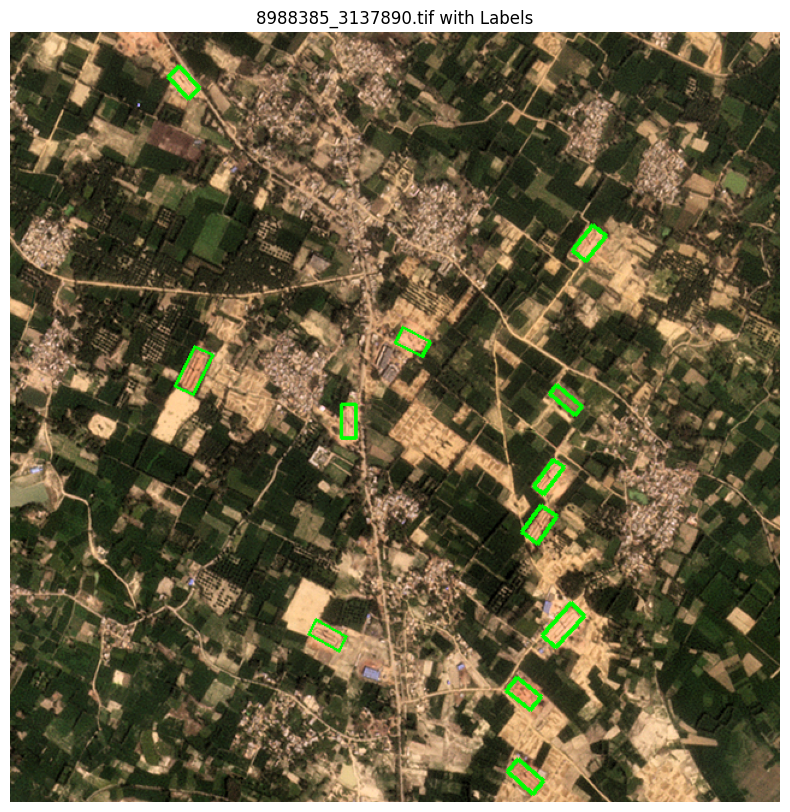

In [31]:
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

def read_obb_labels(label_file):
    labels = []
    with open(label_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:9]))
            polygon = [(coords[i], coords[i+1]) for i in range(0, 8, 2)]
            labels.append((class_id, polygon))
    return labels

def draw_polygons(image, labels, color='red', width=3):
    draw = ImageDraw.Draw(image)
    for _, polygon in labels:
        draw.line(polygon + [polygon[0]], fill=color, width=width)
    return image

# Paths
base_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data")
tif_path = base_dir / "lucknow_airshed/images/8988385_3137890.tif"
label_path ="/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/labels/8988385_3137890.txt"

# Load image and labels
tif_img = Image.open(tif_path).convert("RGB")
width, height = tif_img.size

labels_norm = read_obb_labels(label_path)

# Convert normalized coords to absolute pixel coords
labels_abs = []
for class_id, polygon in labels_norm:
    poly_abs = [(x * width, y * height) for x, y in polygon]
    labels_abs.append((class_id, poly_abs))

# Draw polygons on the TIFF image
img_with_labels = draw_polygons(tif_img.copy(), labels_abs, color='lime', width=3)

# Plot
plt.figure(figsize=(10,10))
plt.imshow(img_with_labels)
plt.title("8988385_3137890.tif with Labels")
plt.axis('off')
plt.show()


In [40]:
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

base_dir = Path("/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data")
tif_path = base_dir / "lucknow_airshed/images"
label_path ="/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/lucknow_airshed/labels"

# Function to read YOLO polygon labels
def read_yolo_labels(label_file):
    labels = []
    with open(label_file, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            coords = list(map(float, parts[1:9]))
            polygon = [(coords[i], coords[i + 1]) for i in range(0, 8, 2)]
            labels.append((class_id, polygon))
    return labels

# Draw polygons on image
def draw_polygons_on_image(image, labels, color='red', width=2):
    draw = ImageDraw.Draw(image)
    for _, polygon in labels:
        draw.line(polygon + [polygon[0]], fill=color, width=width)
    return image

# Choose a specific TIF name (e.g., from your mapping)
tif_name = "9021406_3115876.tif"  # ← You can replace this with any .tif name from the mapping
tif_path = tif_dir / tif_name
label_name = tif_name.replace(".tif", ".txt")
label_path = label_dir / label_name

if tif_path.exists() and label_path.exists():
    # Open TIF
    image = Image.open(tif_path).convert("RGB")
    w, h = image.size

    # Read labels and scale to image size
    labels = read_yolo_labels(label_path)
    abs_labels = [(cls, [(x * w, y * h) for x, y in poly]) for cls, poly in labels]

    # Draw polygons
    labeled_img = draw_polygons_on_image(image.copy(), abs_labels)

    # Plot
    plt.figure(figsize=(10, 10))
    plt.imshow(labeled_img)
    plt.title(f"Labels on {tif_name}")
    plt.axis("off")
    plt.show()

else:
    print(f"Missing file: {'image' if not tif_path.exists() else ''} {'label' if not label_path.exists() else ''}")


Missing file: image label


In [1]:
import geemap
import geopandas as gpd
from shapely.geometry import box

# Define bounding box
min_lat, max_lat = 27.10934, 27.12086
min_lon, max_lon = 77.13143, 77.14437

# Create a GeoDataFrame from bounding box
gdf = gpd.GeoDataFrame(
    {'geometry': [box(min_lon, min_lat, max_lon, max_lat)]},
    crs="EPSG:4326"
)

# Create map
Map = geemap.Map(center=[27.1151, 77.1379], zoom=15)
Map.add_gdf(gdf, layer_name="Sentinel Image Extent")
Map


Map(center=[27.1151, 77.1379], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDa…

In [2]:
import geemap
import geopandas as gpd
import math
from shapely.geometry import box

# Define center coordinates and image size (in meters)
center_lat, center_lon = 27.1151, 77.1379
image_size_m = 1280  # 128 pixels × 10m resolution

# Convert meters to degrees
half_lat_deg = (image_size_m / 2) / 111000
half_lon_deg = (image_size_m / 2) / (111000 * abs(math.cos(math.radians(center_lat))))

# Bounding box coordinates
min_lat = center_lat - half_lat_deg
max_lat = center_lat + half_lat_deg
min_lon = center_lon - half_lon_deg
max_lon = center_lon + half_lon_deg

# Create GeoDataFrame with bounding box
bbox = box(min_lon, min_lat, max_lon, max_lat)
gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# Create map with satellite view
Map = geemap.Map(center=[center_lat, center_lon], zoom=15, basemap='SATELLITE')
Map.add_gdf(gdf, layer_name="Sentinel Image Area")
Map


Map(center=[27.1151, 77.1379], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDa…

In [6]:
import requests
import leafmap
import geopandas as gpd
from shapely.geometry import box
import math

# --------------------------
# Planet API Setup
# --------------------------
PLANET_API_KEY = "PLAK728a0100ad5746d4ab8e06a617215030"
headers = {"Authorization": f"api-key {PLANET_API_KEY}"}
quarter = "2024"  # or a specific month like "2024_01"
params = {"name__contains": quarter}

# Fetch mosaic metadata
response = requests.get("https://api.planet.com/basemaps/v1/mosaics", headers=headers, params=params)
mosaics = response.json()["mosaics"]

# Get the first mosaic ID and construct XYZ URL
mosaic_id = mosaics[0]["id"]
planet_xyz = f"https://tiles.planet.com/basemaps/v1/planet-tiles/{mosaic_id}/gmap/{{z}}/{{x}}/{{y}}.png?api_key={PLANET_API_KEY}"

# --------------------------
# Sentinel Image Coordinates
# --------------------------
center_lat = 27.1151
center_lon = 77.1379
image_size_m = 1280  # 128x128 at 10m resolution

# Convert to degrees
half_lat_deg = (image_size_m / 2) / 111000
half_lon_deg = (image_size_m / 2) / (111000 * abs(math.cos(math.radians(center_lat))))

# Bounding box
min_lat = center_lat - half_lat_deg
max_lat = center_lat + half_lat_deg
min_lon = center_lon - half_lon_deg
max_lon = center_lon + half_lon_deg

bbox = box(min_lon, min_lat, max_lon, max_lat)
gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# --------------------------
# Plotting on Leafmap
# --------------------------
Map = geemap.Map(center=[center_lat, center_lon], zoom=15, basemap='SATELLITE')
Map.add_tile_layer(url=planet_xyz, name="Planet Basemap", attribution="Planet Labs")
Map.add_gdf(gdf, layer_name="Sentinel Bounding Box", style={'fillColor': 'red', 'color': 'red', 'weight': 2})
Map


Map(center=[27.1151, 77.1379], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDa…

In [7]:
import requests
import leafmap
import geopandas as gpd
from shapely.geometry import box
import math
import os

# --------------------------
# Planet API Setup
# --------------------------
PLANET_API_KEY = "PLAK728a0100ad5746d4ab8e06a617215030"
headers = {"Authorization": f"api-key {PLANET_API_KEY}"}
quarter = "2024"  # filter for year/mosaic
params = {"name__contains": quarter}

# Fetch mosaic metadata
response = requests.get("https://api.planet.com/basemaps/v1/mosaics", headers=headers, params=params)
mosaics = response.json().get("mosaics", [])
assert mosaics, "No mosaics found for the given time filter."

mosaic = mosaics[0]
mosaic_id = mosaic["id"]
print(f"Using mosaic: {mosaic['name']} ({mosaic_id})")

# XYZ tile URL for leaflet/leafmap
planet_xyz = f"https://tiles.planet.com/basemaps/v1/planet-tiles/{mosaic_id}/gmap/{{z}}/{{x}}/{{y}}.png?api_key={PLANET_API_KEY}"

# --------------------------
# Sentinel Image Coordinates
# --------------------------
center_lat = 27.1151
center_lon = 77.1379
image_size_m = 1280  # 128x128 pixels at 10m resolution

# Convert size to approximate degrees
half_lat_deg = (image_size_m / 2) / 111000
half_lon_deg = (image_size_m / 2) / (111000 * abs(math.cos(math.radians(center_lat))))

# Bounding box
min_lat = center_lat - half_lat_deg
max_lat = center_lat + half_lat_deg
min_lon = center_lon - half_lon_deg
max_lon = center_lon + half_lon_deg

bbox = box(min_lon, min_lat, max_lon, max_lat)
gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# --------------------------
# Leafmap Visualization
# --------------------------
m = leafmap.Map(center=(center_lat, center_lon), zoom=15)
m.add_tile_layer(url=planet_xyz, name="Planet Mosaic", attribution="Planet")
m.add_gdf(gdf, layer_name="Sentinel Image Area", style={'color': 'red', 'weight': 2})
m

# --------------------------
# Fetching Quads for Download
# --------------------------
params = {
    "bbox": f"{min_lon},{min_lat},{max_lon},{max_lat}",
    "_page_size": 10000,
}

quad_url = f"https://api.planet.com/basemaps/v1/mosaics/{mosaic_id}/quads"
response = requests.get(quad_url, headers=headers, params=params)
quads = response.json().get('items', [])
print(f"Number of quads found: {len(quads)}")

# --------------------------
# Download Quads
# --------------------------
download_dir = "planet_quads"
os.makedirs(download_dir, exist_ok=True)

for quad in quads:
    quad_id = quad["id"]
    quad_url = quad["_links"]["download"]
    filename = os.path.join(download_dir, f"{quad_id}.tif")

    if not os.path.exists(filename):
        print(f"Downloading: {quad_id}")
        r = requests.get(quad_url, headers=headers)
        with open(filename, "wb") as f:
            f.write(r.content)
    else:
        print(f"Already downloaded: {quad_id}")


Using mosaic: global_monthly_2024_01_mosaic (59a742c6-faa9-43d8-a0c3-e06700f21447)
Number of quads found: 1
Downloading: 1462-1184


In [13]:
import rasterio
from rasterio.mask import mask
from shapely.geometry import box, mapping
import geopandas as gpd
import os

# ---------------------------
# Sentinel Image Coordinates
# ---------------------------
center_lat = 27.1151
center_lon = 77.1379
image_size_m = 1280  # 128x128 pixels at 10m

# Convert to degrees (approx.)
half_lat_deg = (image_size_m / 2) / 111000
half_lon_deg = (image_size_m / 2) / (111000 * abs(math.cos(math.radians(center_lat))))

min_lat = center_lat - half_lat_deg
max_lat = center_lat + half_lat_deg
min_lon = center_lon - half_lon_deg
max_lon = center_lon + half_lon_deg

# Create AOI as GeoDataFrame
bbox = box(min_lon, min_lat, max_lon, max_lat)
aoi_gdf = gpd.GeoDataFrame({'geometry': [bbox]}, crs="EPSG:4326")

# ---------------------------
# Load Planet Quad
# ---------------------------
quad_path = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/brick_kilns_neurips_2025/notebooks/planet_quads/1462-1184.tif"
with rasterio.open(quad_path) as src:
    # Reproject AOI to match raster CRS
    aoi_projected = aoi_gdf.to_crs(src.crs)
    print(f"AOI projected CRS: {aoi_projected.crs}")
    geoms = [mapping(geom) for geom in aoi_projected.geometry]
    print(f"AOI geometry: {geoms}") 

    # Crop
    out_image, out_transform = mask(src, geoms, crop=True)
    print(f"Output image shape: {out_image.shape}")
    out_meta = src.meta.copy()

# Update metadata
out_meta.update({
    "driver": "GTiff",
    "height": out_image.shape[1],
    "width": out_image.shape[2],
    "transform": out_transform
})

# Save cropped image
output_path = os.path.join(os.path.dirname(quad_path), "cropped_from_planet_quad.tif")
with rasterio.open(output_path, "w", **out_meta) as dest:
    dest.write(out_image)

print(f"✅ Cropped image saved to: {output_path}")


AOI projected CRS: PROJCS["WGS 84 / Pseudo-Mercator",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Mercator_1SP"],PARAMETER["central_meridian",0],PARAMETER["scale_factor",1],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],EXTENSION["PROJ4","+proj=merc +a=6378137 +b=6378137 +lat_ts=0 +lon_0=0 +x_0=0 +y_0=0 +k=1 +units=m +nadgrids=@null +wktext +no_defs"],AUTHORITY["EPSG","3857"]]
AOI geometry: [{'type': 'Polygon', 'coordinates': (((8587672.84465017, 3137138.270189869), (8587672.84465017, 3138580.4617690057), (8586230.653074745, 3138580.4617690057), (8586230.653074745, 3137138.270189869), (8587672.84465017, 3137138.270189869)),)}]
Output image shape: (4, 302, 303)
✅ Cropped 

In [10]:
import leafmap.foliumap as leafmap

# Use leafmap.foliumap to get multiple basemaps easily
m = leafmap.Map(center=(center_lat, center_lon), zoom=15)

# Add Planet mosaic (already there)
m.add_tile_layer(url=planet_xyz, name="Planet Mosaic", attribution="Planet")

# Add Google Satellite layer for comparison
m.add_basemap("Google Satellite")

# Add Sentinel-2 basemap via leafmap default basemaps
m.add_basemap("Sentinel-2")

# Add your sentinel area bounding box polygon
m.add_gdf(gdf, layer_name="Sentinel Image Area", style={'color': 'red', 'weight': 2})

m  # display the map



Basemap can only be one of the following: OpenStreetMap, ROADMAP, SATELLITE, TERRAIN, HYBRID, FWS NWI Wetlands, FWS NWI Wetlands Raster, NLCD 2021 CONUS Land Cover, NLCD 2019 CONUS Land Cover, NLCD 2016 CONUS Land Cover, NLCD 2013 CONUS Land Cover, NLCD 2011 CONUS Land Cover, NLCD 2008 CONUS Land Cover, NLCD 2006 CONUS Land Cover, NLCD 2004 CONUS Land Cover, NLCD 2001 CONUS Land Cover, USGS NAIP Imagery, USGS NAIP Imagery False Color, USGS NAIP Imagery NDVI, USGS Hydrography, USGS 3DEP Elevation, USGS 3DEP Elevation Index, ESA WorldCover 2020, ESA WorldCover 2020 S2 FCC, ESA WorldCover 2020 S2 TCC, ESA WorldCover 2021, ESA WorldCover 2021 S2 FCC, ESA WorldCover 2021 S2 TCC, BaseMapDE.Color, BaseMapDE.Grey, BasemapAT.basemap, BasemapAT.grau, BasemapAT.highdpi, BasemapAT.orthofoto, BasemapAT.overlay, BasemapAT.surface, BasemapAT.terrain, CartoDB.DarkMatter, CartoDB.DarkMatterNoLabels, CartoDB.DarkMatterOnlyLabels, CartoDB.Positron, CartoDB.PositronNoLabels, CartoDB.PositronOnlyLabels, Ca

In [15]:
import cv2

# Input and output paths
input_path = "/home/rishabh.mondal/Brick-Kilns-project/ijcai_2025_kilns/data/processed_data/sentinel/delhi_ncr_region/images/27.1151_77.1379.png"
output_path = "./27.1151_77.1379_bilinear.png"

# Read the image
img = cv2.imread(input_path, cv2.IMREAD_UNCHANGED)

# Check if image loaded successfully
if img is None:
    raise FileNotFoundError(f"Image not found at {input_path}")

# Define new size (example: doubling the size)
scale_factor = 4  # you can change this factor
new_width = int(img.shape[1] * scale_factor)
new_height = int(img.shape[0] * scale_factor)

# Resize using bilinear interpolation
resized_img = cv2.resize(img, (new_width, new_height), interpolation=cv2.INTER_LINEAR)

# Save the resized image
cv2.imwrite(output_path, resized_img)

print(f"Resized image saved at {output_path}")


Resized image saved at ./27.1151_77.1379_bilinear.png


In [6]:
import pandas as pd

data = {
    "Country": [
        "India", "India", "India", "India", "India", "India", "India", "India", "India",
        "Bangladesh", "Bangladesh", "Bangladesh", "Bangladesh", "Bangladesh", "Bangladesh", "Bangladesh", "Bangladesh",
        "Pakistan", "Pakistan", "Pakistan", "Pakistan",
        "Afghanistan"
    ],
    "State/Region": [
        "Gujarat", "Assam", "Jharkhand", "Haryana", "Rajasthan", "Punjab", "West Bengal", "Bihar", "Uttar Pradesh",
        "Sylhet", "Barisal", "Mymensingh", "Rangpur", "Khulna", "Rajshahi", "Dhaka", "Chittagong",
        "Balochistan", "Sindh", "Khyber Pakhtunkhwa", "Punjab (PK)",
        "34 Provinces"
    ],
    "CFCBK": [
        57, 5, 17, 1, 34, 1, 67, 58, 1699,
        0, 0, 0, 0, 0, 0, 2, 0,
        1, 1, 0, 1,
        0
    ],
    "FCBK": [
        961, 1239, 1229, 159, 2137, 444, 1575, 2038, 11669,
        9, 109, 108, 112, 388, 251, 92, 392,
        63, 788, 846, 8746,
        608
    ],
    "Zigzag": [
        45, 109, 191, 2231, 232, 2074, 2776, 5392, 6542,
        216, 256, 411, 894, 645, 880, 1205, 933,
        1, 2, 2, 1726,
        1
    ],
    "Total": [
        1063, 1353, 1437, 2391, 2403, 2519, 4418, 7488, 19910,
        225, 365, 519, 1006, 1033, 1131, 1299, 1325,
        65, 791, 848, 10473,
        609
    ]
}

df = pd.DataFrame(data)
df.head()


,Country,State/Region,CFCBK,FCBK,Zigzag,Total
0,India,Gujarat,57,961,45,1063
1,India,Assam,5,1239,109,1353
2,India,Jharkhand,17,1229,191,1437
3,India,Haryana,1,159,2231,2391
4,India,Rajasthan,34,2137,232,2403


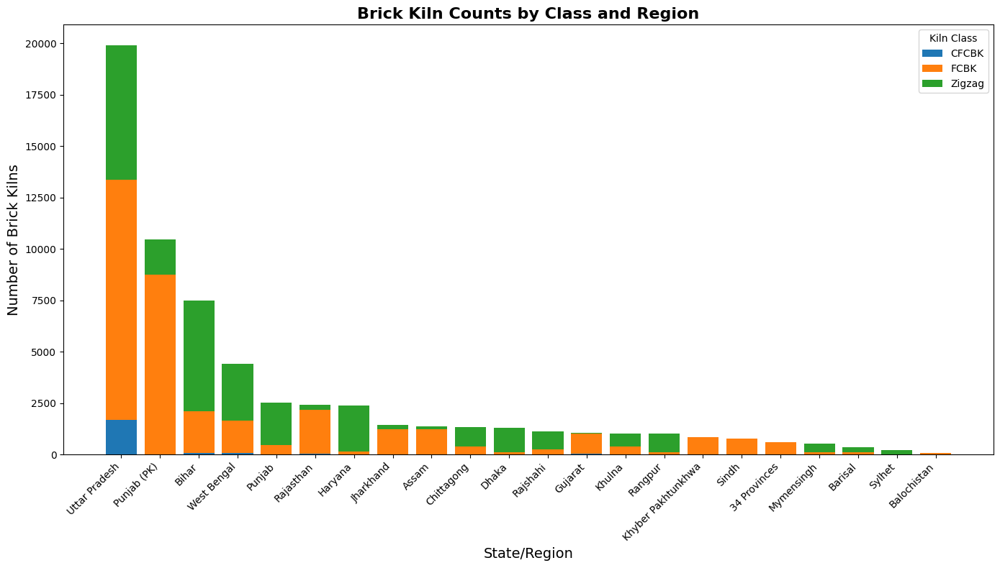

In [7]:
import matplotlib.pyplot as plt

# Sort the dataframe by total for better visualization
df_sorted = df.sort_values('Total', ascending=False)

# Plot stacked bar chart
fig, ax = plt.subplots(figsize=(14, 8))

# Plot bars
ax.bar(df_sorted['State/Region'], df_sorted['CFCBK'], label='CFCBK', color='#1f77b4')
ax.bar(df_sorted['State/Region'], df_sorted['FCBK'], bottom=df_sorted['CFCBK'], label='FCBK', color='#ff7f0e')
ax.bar(df_sorted['State/Region'], df_sorted['Zigzag'], bottom=df_sorted['CFCBK'] + df_sorted['FCBK'], label='Zigzag', color='#2ca02c')

# Customize the plot
ax.set_title('Brick Kiln Counts by Class and Region', fontsize=16, weight='bold')
ax.set_ylabel('Number of Brick Kilns', fontsize=14)
ax.set_xlabel('State/Region', fontsize=14)
plt.xticks(rotation=45, ha='right')
ax.legend(title='Kiln Class')
plt.tight_layout()

plt.show()


<Figure size 1000x600 with 0 Axes>

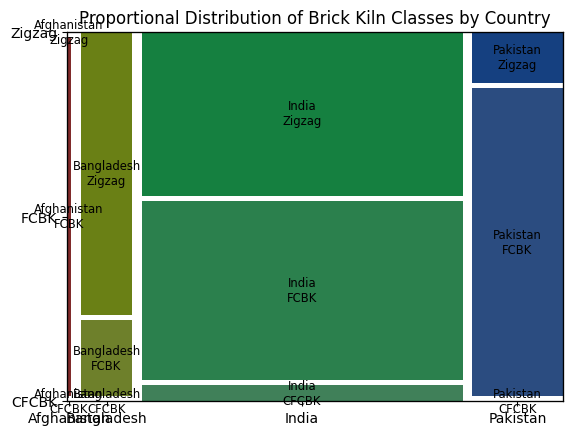

In [8]:
from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.pyplot as plt
import pandas as pd

# Prepare data in dictionary format for mosaic
# Sum kiln classes per country
df_grouped = df.groupby('Country')[['CFCBK', 'FCBK', 'Zigzag']].sum()

# Reshape for mosaic input: { (Country, KilnClass): count }
data_dict = {}
for country in df_grouped.index:
    for kiln_class in ['CFCBK', 'FCBK', 'Zigzag']:
        data_dict[(country, kiln_class)] = df_grouped.loc[country, kiln_class]

plt.figure(figsize=(10,6))
mosaic(data_dict, title='Proportional Distribution of Brick Kiln Classes by Country', gap=0.02)

plt.show()


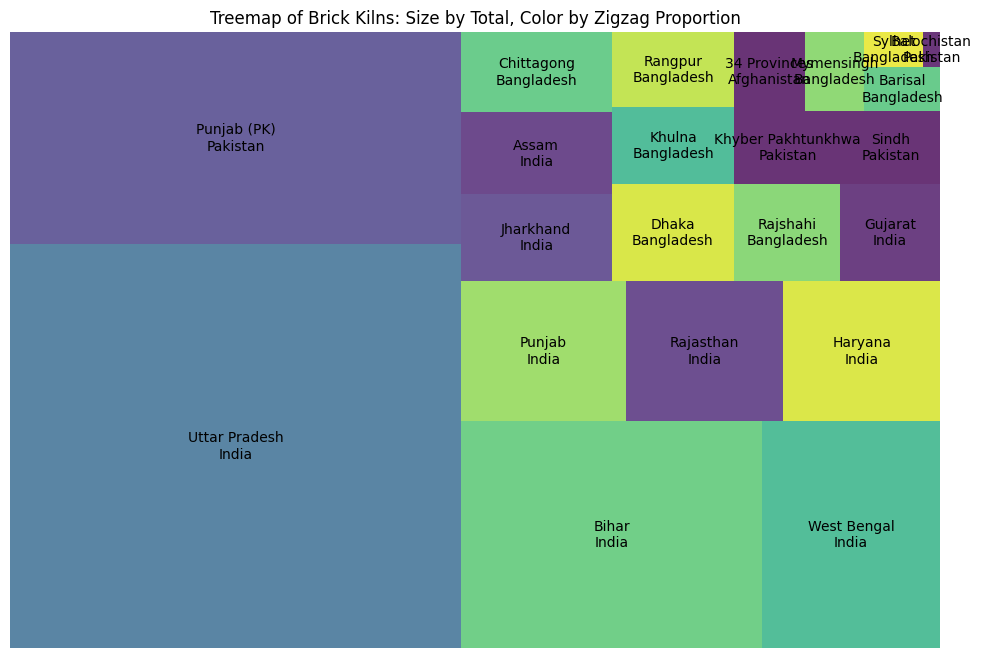

In [9]:
import squarify
import matplotlib.pyplot as plt
import pandas as pd

# Calculate total kilns per State/Region for size, and % Zigzag for color
df['Total'] = df['CFCBK'] + df['FCBK'] + df['Zigzag']
df['Zigzag_pct'] = df['Zigzag'] / df['Total']

# Sort by total count for better treemap layout
df_sorted = df.sort_values('Total', ascending=False)

plt.figure(figsize=(12,8))

# Treemap rectangles sized by Total, colored by Zigzag %
squarify.plot(sizes=df_sorted['Total'], 
              label=df_sorted['State/Region'] + "\n" + df_sorted['Country'], 
              color=plt.cm.viridis(df_sorted['Zigzag_pct']), alpha=0.8)

plt.title('Treemap of Brick Kilns: Size by Total, Color by Zigzag Proportion')
plt.axis('off')
plt.show()


In [10]:
import plotly.express as px

# Melt the dataframe for kiln classes
df_melted = df.melt(id_vars=['Country', 'State/Region'], value_vars=['CFCBK', 'FCBK', 'Zigzag'],
                    var_name='Kiln Class', value_name='Count')

fig = px.parallel_categories(df_melted, dimensions=['Country', 'Kiln Class'],
                             color='Count', color_continuous_scale=px.colors.sequential.Inferno,
                             labels={'Count':'Brick Kiln Count'},
                             title='Parallel Categories Plot of Kiln Classes by Country')

fig.show()


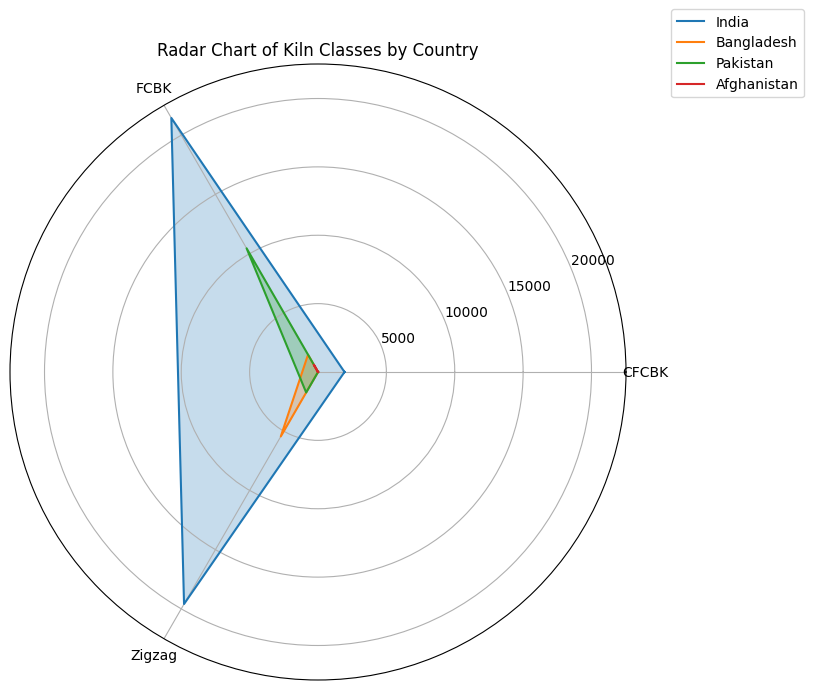

In [11]:
import matplotlib.pyplot as plt
import numpy as np

countries = df['Country'].unique()
classes = ['CFCBK', 'FCBK', 'Zigzag']

fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(111, polar=True)

# Number of variables
num_vars = len(classes)

# Compute angles for radar plot
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]  # Complete the loop

for country in countries:
    values = df[df['Country'] == country][classes].sum().tolist()
    values += values[:1]
    ax.plot(angles, values, label=country)
    ax.fill(angles, values, alpha=0.25)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(classes)
plt.title("Radar Chart of Kiln Classes by Country")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.show()


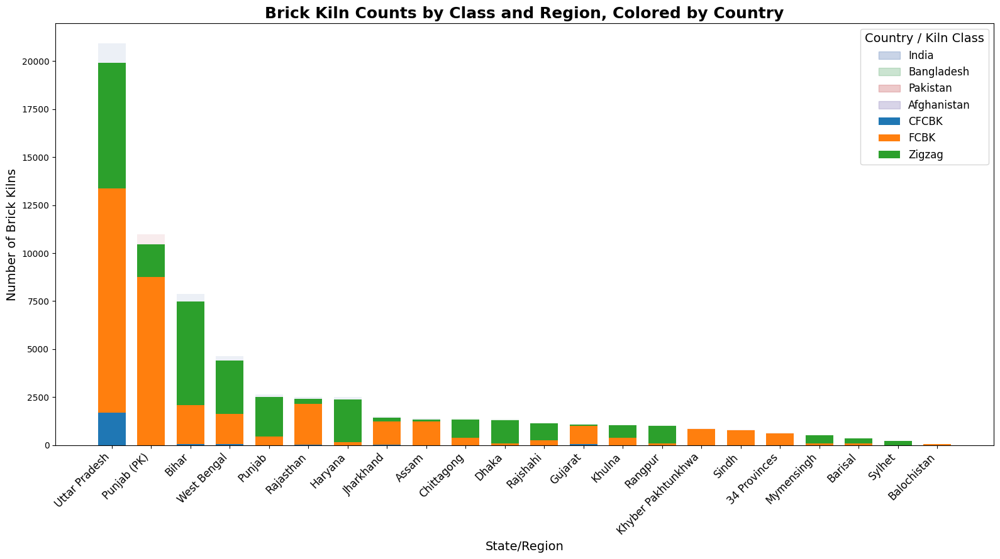

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# # Sample data (replace with your full DataFrame)
# data = {
#     'Country': ['India', 'India', 'Bangladesh', 'Bangladesh', 'Pakistan', 'Pakistan', 'Afghanistan'],
#     'State/Region': ['Gujarat', 'Uttar Pradesh', 'Khulna', 'Dhaka', 'Punjab (PK)', 'Sindh', '34 Provinces'],
#     'CFCBK': [57, 1699, 0, 2, 1, 1, 0],
#     'FCBK': [961, 11669, 388, 92, 8746, 788, 608],
#     'Zigzag': [45, 6542, 645, 1205, 1726, 2, 1]
# }

# df = pd.DataFrame(data)
df['Total'] = df['CFCBK'] + df['FCBK'] + df['Zigzag']
df_sorted = df.sort_values('Total', ascending=False)

# # Kiln class colors (consistent across countries)
class_colors = {
    'CFCBK': '#1f77b4',  # Blue
    'FCBK': '#ff7f0e',   # Orange
    'Zigzag': '#2ca02c'  # Green
}

# Base colors for countries (lighter shades for states)
country_colors = {
    'India': '#4C72B0',
    'Bangladesh': '#55A868',
    'Pakistan': '#C44E52',
    'Afghanistan': '#8172B3'
}

fig, ax = plt.subplots(figsize=(16, 9))

# For X axis, get indices for each state
indices = np.arange(len(df_sorted))

# Width of bars
bar_width = 0.7

# Bottom positions for stacking
bottom_fc = df_sorted['CFCBK']
bottom_zig = df_sorted['CFCBK'] + df_sorted['FCBK']

# Plot each kiln class stacked, coloring by kiln class
bars_cfc = ax.bar(indices, df_sorted['CFCBK'], color=class_colors['CFCBK'], label='CFCBK', width=bar_width)
bars_fcbk = ax.bar(indices, df_sorted['FCBK'], bottom=df_sorted['CFCBK'], color=class_colors['FCBK'], label='FCBK', width=bar_width)
bars_zigzag = ax.bar(indices, df_sorted['Zigzag'], bottom=bottom_zig, color=class_colors['Zigzag'], label='Zigzag', width=bar_width)

# Overlay a faint rectangle behind each bar colored by country
for i, country in enumerate(df_sorted['Country']):
    ax.bar(indices[i], df_sorted.iloc[i]['Total'] * 1.05, 
           color=country_colors[country], alpha=0.1, width=bar_width, zorder=0)

# X axis labels and rotation
ax.set_xticks(indices)
ax.set_xticklabels(df_sorted['State/Region'], rotation=45, ha='right', fontsize=12)

# Titles and labels
ax.set_title('Brick Kiln Counts by Class and Region, Colored by Country', fontsize=18, weight='bold')
ax.set_xlabel('State/Region', fontsize=14)
ax.set_ylabel('Number of Brick Kilns', fontsize=14)

# Legend for kiln classes
ax.legend(title='Kiln Class', fontsize=12, title_fontsize=13)

# Add custom legend for countries (colored patches)
from matplotlib.patches import Patch
country_patches = [Patch(color=color, alpha=0.3, label=country) for country, color in country_colors.items()]
ax.legend(handles=country_patches + [bars_cfc, bars_fcbk, bars_zigzag],
          labels=list(country_colors.keys()) + list(class_colors.keys()),
          title='Country / Kiln Class',
          fontsize=12, title_fontsize=14, loc='upper right')

plt.tight_layout()
plt.show()


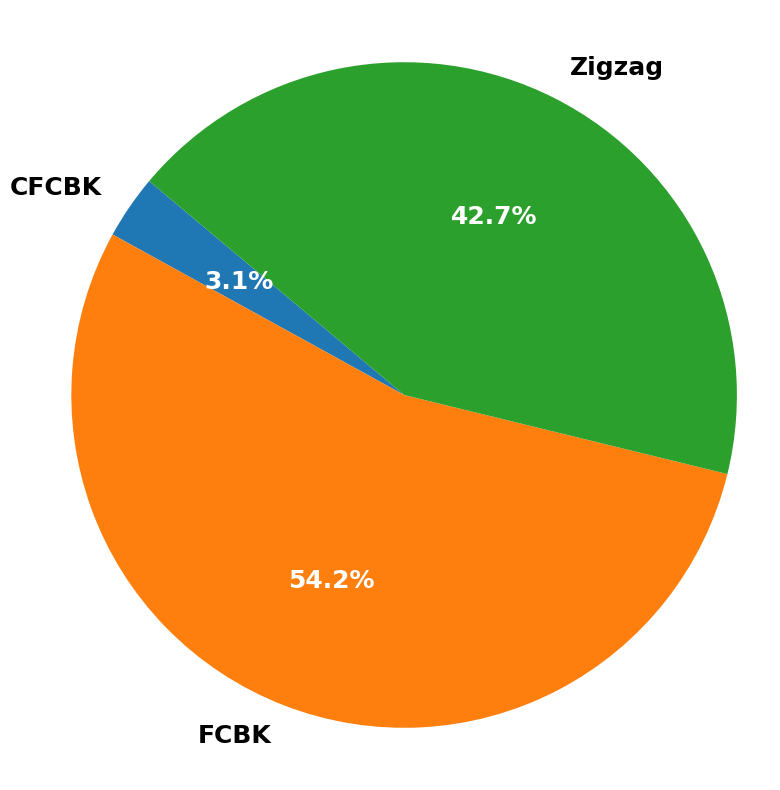

In [34]:
import matplotlib.pyplot as plt

# Sum kiln classes across all regions
class_sums = df[['CFCBK', 'FCBK', 'Zigzag']].sum()

# Colors for kiln classes
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# Plot pie chart
fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(
    class_sums,
    labels=class_sums.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors,
    textprops={'fontsize': 14, 'weight': 'bold'}
)

# Title
# ax.set_title('Overall Distribution of Brick Kiln Classes', fontsize=16, weight='bold')
plt.setp(autotexts, size=18, weight='bold', color='white')
plt.setp(texts, size=18, weight='bold')
plt.axis('equal')  # Equal aspect ratio ensures pie chart is circular.
plt.tight_layout()
plt.savefig("brick_kiln_classes_distribution.png", dpi=600)
plt.show()


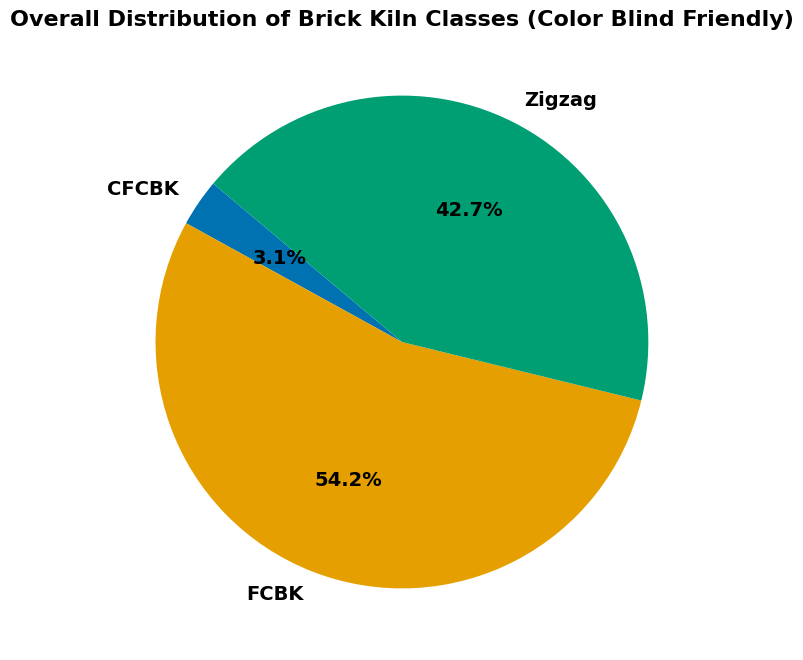

In [14]:
import matplotlib.pyplot as plt

# Sum kiln classes across all regions
class_sums = df[['CFCBK', 'FCBK', 'Zigzag']].sum()

# Color-blind friendly palette
colors_cb = ['#0072B2', '#E69F00', '#009E73']

fig, ax = plt.subplots(figsize=(8, 8))
wedges, texts, autotexts = ax.pie(
    class_sums,
    labels=class_sums.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors_cb,
    textprops={'fontsize': 14, 'weight': 'bold'}
)

ax.set_title('Overall Distribution of Brick Kiln Classes (Color Blind Friendly)', fontsize=16, weight='bold')

plt.show()


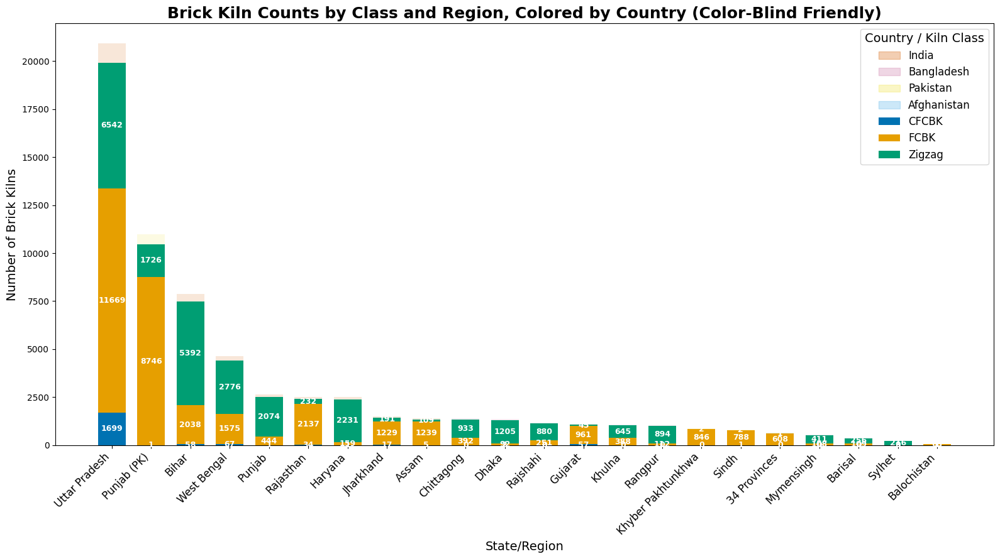

In [15]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Color-blind friendly colors for kiln classes (blue, orange, green replaced)
class_colors = {
    'CFCBK': '#0072B2',  # Blue
    'FCBK': '#E69F00',   # Orange
    'Zigzag': '#009E73'  # Green
}

country_colors = {
    'India': '#D55E00',       # Vermilion
    'Bangladesh': '#CC79A7',  # Reddish purple
    'Pakistan': '#F0E442',    # Yellow
    'Afghanistan': '#56B4E9'  # Sky blue
}

fig, ax = plt.subplots(figsize=(16, 9))

indices = np.arange(len(df_sorted))
bar_width = 0.7

bars_cfc = ax.bar(indices, df_sorted['CFCBK'], color=class_colors['CFCBK'], label='CFCBK', width=bar_width)
bars_fcbk = ax.bar(indices, df_sorted['FCBK'], bottom=df_sorted['CFCBK'], color=class_colors['FCBK'], label='FCBK', width=bar_width)
bars_zigzag = ax.bar(indices, df_sorted['Zigzag'], bottom=df_sorted['CFCBK'] + df_sorted['FCBK'], color=class_colors['Zigzag'], label='Zigzag', width=bar_width)

for i, country in enumerate(df_sorted['Country']):
    ax.bar(indices[i], df_sorted.iloc[i]['Total'] * 1.05, 
           color=country_colors[country], alpha=0.15, width=bar_width, zorder=0)

ax.set_xticks(indices)
ax.set_xticklabels(df_sorted['State/Region'], rotation=45, ha='right', fontsize=12)

ax.set_title('Brick Kiln Counts by Class and Region, Colored by Country (Color-Blind Friendly)', fontsize=18, weight='bold')
ax.set_xlabel('State/Region', fontsize=14)
ax.set_ylabel('Number of Brick Kilns', fontsize=14)

# Add value labels on top of each bar segment
for i in range(len(df_sorted)):
    cfc = df_sorted.iloc[i]['CFCBK']
    fcbk = df_sorted.iloc[i]['FCBK']
    zig = df_sorted.iloc[i]['Zigzag']
    
    ax.text(indices[i], cfc / 2, str(cfc), ha='center', va='center', color='white', fontsize=9, fontweight='bold')
    ax.text(indices[i], cfc + fcbk / 2, str(fcbk), ha='center', va='center', color='white', fontsize=9, fontweight='bold')
    ax.text(indices[i], cfc + fcbk + zig / 2, str(zig), ha='center', va='center', color='white', fontsize=9, fontweight='bold')

country_patches = [Patch(color=color, alpha=0.3, label=country) for country, color in country_colors.items()]
handles = country_patches + [bars_cfc, bars_fcbk, bars_zigzag]
labels = list(country_colors.keys()) + list(class_colors.keys())

ax.legend(handles=handles, labels=labels, title='Country / Kiln Class',
          fontsize=12, title_fontsize=14, loc='upper right')

plt.tight_layout()
plt.show()


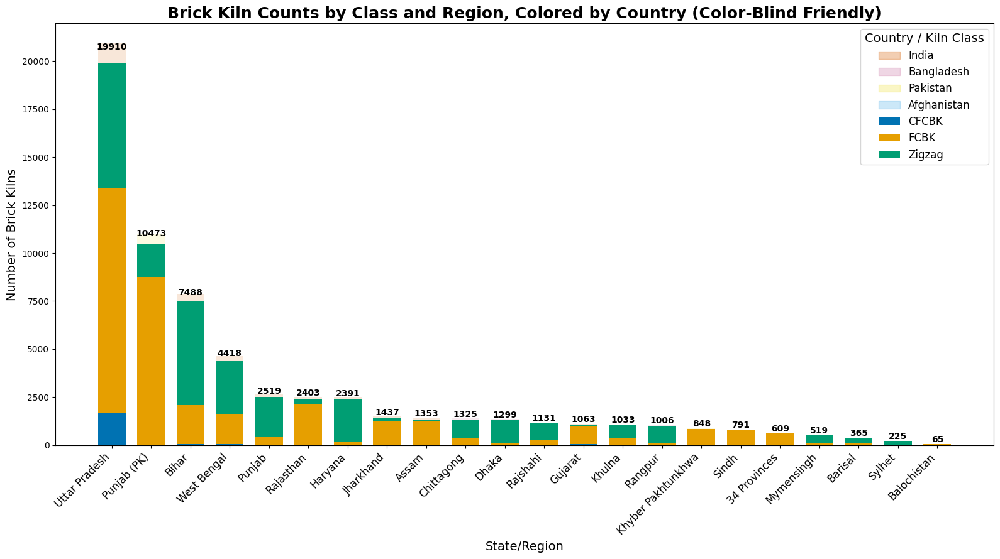

In [16]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Color-blind friendly colors for kiln classes (blue, orange, green replaced)
class_colors = {
    'CFCBK': '#0072B2',  # Blue
    'FCBK': '#E69F00',   # Orange
    'Zigzag': '#009E73'  # Green
}

country_colors = {
    'India': '#D55E00',       # Vermilion
    'Bangladesh': '#CC79A7',  # Reddish purple
    'Pakistan': '#F0E442',    # Yellow
    'Afghanistan': '#56B4E9'  # Sky blue
}

fig, ax = plt.subplots(figsize=(16, 9))

indices = np.arange(len(df_sorted))
bar_width = 0.7

bars_cfc = ax.bar(indices, df_sorted['CFCBK'], color=class_colors['CFCBK'], label='CFCBK', width=bar_width)
bars_fcbk = ax.bar(indices, df_sorted['FCBK'], bottom=df_sorted['CFCBK'], color=class_colors['FCBK'], label='FCBK', width=bar_width)
bars_zigzag = ax.bar(indices, df_sorted['Zigzag'], bottom=df_sorted['CFCBK'] + df_sorted['FCBK'], color=class_colors['Zigzag'], label='Zigzag', width=bar_width)

for i, country in enumerate(df_sorted['Country']):
    ax.bar(indices[i], df_sorted.iloc[i]['Total'] * 1.05, 
           color=country_colors[country], alpha=0.15, width=bar_width, zorder=0)

ax.set_xticks(indices)
ax.set_xticklabels(df_sorted['State/Region'], rotation=45, ha='right', fontsize=12)

ax.set_title('Brick Kiln Counts by Class and Region, Colored by Country (Color-Blind Friendly)', fontsize=18, weight='bold')
ax.set_xlabel('State/Region', fontsize=14)
ax.set_ylabel('Number of Brick Kilns', fontsize=14)

# Add total value labels on top of each stacked bar
for i in range(len(df_sorted)):
    total = df_sorted.iloc[i]['Total']
    ax.text(indices[i], total + total * 0.03, str(total), ha='center', va='bottom', fontsize=10, fontweight='bold')

country_patches = [Patch(color=color, alpha=0.3, label=country) for country, color in country_colors.items()]
handles = country_patches + [bars_cfc, bars_fcbk, bars_zigzag]
labels = list(country_colors.keys()) + list(class_colors.keys())

ax.legend(handles=handles, labels=labels, title='Country / Kiln Class',
          fontsize=12, title_fontsize=14, loc='upper right')

plt.tight_layout()
plt.show()


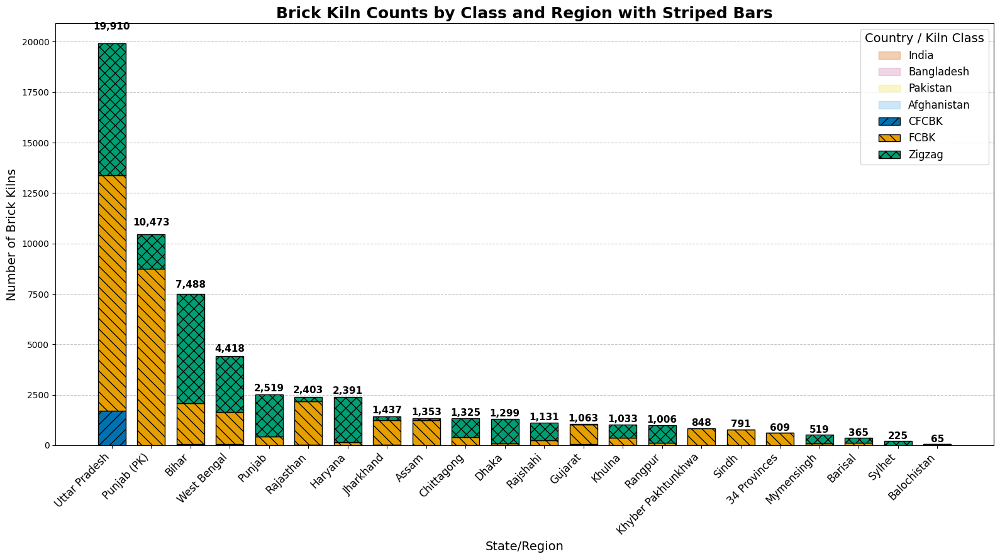

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Define hatch patterns for each kiln class
hatches = {
    'CFCBK': '//',
    'FCBK': '\\\\',
    'Zigzag': 'xx'
}

fig, ax = plt.subplots(figsize=(16, 9))

indices = np.arange(len(df_sorted))
bar_width = 0.7

# Plot bars with hatch patterns and edgecolor
bars_cfc = ax.bar(indices, df_sorted['CFCBK'], color=class_colors['CFCBK'], edgecolor='black',
                  hatch=hatches['CFCBK'], label='CFCBK', width=bar_width)
bars_fcbk = ax.bar(indices, df_sorted['FCBK'], bottom=df_sorted['CFCBK'], color=class_colors['FCBK'], edgecolor='black',
                   hatch=hatches['FCBK'], label='FCBK', width=bar_width)
bars_zigzag = ax.bar(indices, df_sorted['Zigzag'], bottom=df_sorted['CFCBK'] + df_sorted['FCBK'], color=class_colors['Zigzag'],
                     edgecolor='black', hatch=hatches['Zigzag'], label='Zigzag', width=bar_width)

# Add total labels on top of bars
for i in range(len(df_sorted)):
    total = df_sorted.iloc[i]['Total']
    ax.text(indices[i], total + total * 0.03, f'{total:,}', ha='center', va='bottom', fontsize=11, fontweight='bold')

ax.set_xticks(indices)
ax.set_xticklabels(df_sorted['State/Region'], rotation=45, ha='right', fontsize=12)

ax.set_title('Brick Kiln Counts by Class and Region with Striped Bars', fontsize=18, weight='bold')
ax.set_xlabel('State/Region', fontsize=14)
ax.set_ylabel('Number of Brick Kilns', fontsize=14)

# Add grid lines for better readability
ax.yaxis.grid(True, linestyle='--', alpha=0.7)
ax.set_axisbelow(True)

# Legend
country_patches = [Patch(color=color, alpha=0.3, label=country) for country, color in country_colors.items()]
handles = country_patches + [bars_cfc, bars_fcbk, bars_zigzag]
labels = list(country_colors.keys()) + list(class_colors.keys())

ax.legend(handles=handles, labels=labels, title='Country / Kiln Class',
          fontsize=12, title_fontsize=14, loc='upper right')

plt.tight_layout()
plt.show()


/tmp/ipykernel_368774/163052326.py:52: UserWarning:

Mismatched number of handles and labels: len(handles) = 3 len(labels) = 7



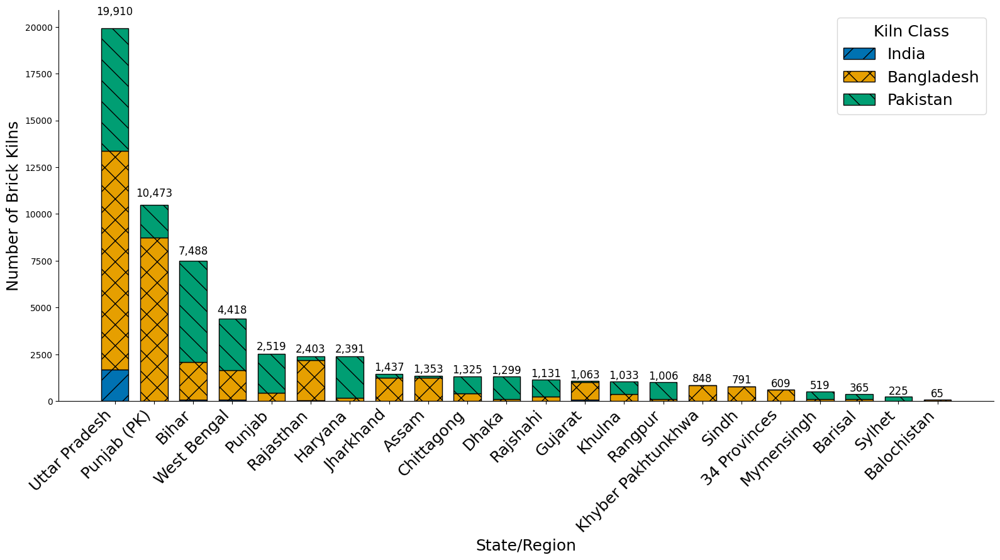

In [41]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

# Assuming df_sorted, class_colors, country_colors are defined as before

hatches = {
    'CFCBK': '/',
    'FCBK': 'x',
    'Zigzag': '\\'
}

fig, ax = plt.subplots(figsize=(16, 9))

indices = np.arange(len(df_sorted))
bar_width = 0.7

# Plot stacked bars with hatches and edge color
bars_cfc = ax.bar(indices, df_sorted['CFCBK'], color=class_colors['CFCBK'], edgecolor='black',
                  hatch=hatches['CFCBK'], label='CFCBK', width=bar_width)
bars_fcbk = ax.bar(indices, df_sorted['FCBK'], bottom=df_sorted['CFCBK'], color=class_colors['FCBK'], edgecolor='black',
                   hatch=hatches['FCBK'], label='FCBK', width=bar_width)
bars_zigzag = ax.bar(indices, df_sorted['Zigzag'], bottom=df_sorted['CFCBK'] + df_sorted['FCBK'], color=class_colors['Zigzag'],
                     edgecolor='black', hatch=hatches['Zigzag'], label='Zigzag', width=bar_width)

# Add total values on top of bars
for i in range(len(df_sorted)):
    total = df_sorted.iloc[i]['Total']
    ax.text(indices[i], total + total * 0.03, f'{total:,}', ha='center', va='bottom', fontsize=12)

# Configure x-axis ticks and labels
ax.set_xticks(indices)
ax.set_xticklabels(df_sorted['State/Region'], rotation=45, ha='right', fontsize=18)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
# Titles and labels
# ax.set_title('Brick Kiln Counts by Class and Region with Striped Bars', fontsize=18)
ax.set_xlabel('State/Region', fontsize=18)
ax.set_ylabel('Number of Brick Kilns', fontsize=18)

# # Grid only on y-axis with dashed lines
# ax.yaxis.grid(True, linestyle='--', alpha=0.7)
# ax.set_axisbelow(True)  # grid lines below bars

# Legend for countries and kiln classes
country_patches = [Patch(color=color, alpha=0.3, label=country) for country, color in country_colors.items()]
handles = [bars_cfc, bars_fcbk, bars_zigzag]
labels = list(country_colors.keys()) + list(class_colors.keys())

ax.legend(handles=handles, labels=labels, title='Kiln Class',
          fontsize=18, title_fontsize=18, loc='upper right')

# # --- Pie chart inset ---
# total_cfc = df_sorted['CFCBK'].sum()
# total_fcbk = df_sorted['FCBK'].sum()
# total_zig = df_sorted['Zigzag'].sum()

# pie_sizes = [total_cfc, total_fcbk, total_zig]
# pie_labels = ['CFCBK', 'FCBK', 'Zigzag']
# pie_colors = [class_colors[k] for k in pie_labels]

# # Inset axes (positioned within the figure)
# inset_ax = fig.add_axes([0.55, 0.5, 0.3, 0.3], zorder=10)
# wedges, texts, autotexts = inset_ax.pie(
#     pie_sizes, labels=pie_labels, autopct='%1.1f%%', colors=pie_colors,
#     startangle=140, textprops={'fontsize': 11}
# )
# inset_ax.set_title('Overall Kiln Class Distribution', fontsize=14)

plt.tight_layout()
plt.savefig('stacked_bar_with_pie_inset.png', dpi=600)
plt.show()
